**Set environment**

In [1]:
suppressMessages(suppressWarnings(source("../run_config_project_sing.R")))
show_env()

You are working on        Singularity: singularity_proj_encode_fcc 
BASE DIRECTORY (FD_BASE): /data/reddylab/Kuei 
REPO DIRECTORY (FD_REPO): /data/reddylab/Kuei/repo 
WORK DIRECTORY (FD_WORK): /data/reddylab/Kuei/work 
DATA DIRECTORY (FD_DATA): /data/reddylab/Kuei/data 

You are working with      ENCODE FCC 
PATH OF PROJECT (FD_PRJ): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC 
PROJECT RESULTS (FD_RES): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/results 
PROJECT SCRIPTS (FD_EXE): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/scripts 
PROJECT DATA    (FD_DAT): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/data 
PROJECT NOTE    (FD_NBK): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/notebooks 
PROJECT DOCS    (FD_DOC): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/docs 
PROJECT LOG     (FD_LOG): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/log 
PROJECT REF     (FD_REF): /data/reddylab/Kuei/repo/Proj_ENCODE_FCC/references 



## Import data

In [2]:
txt_fdiry = file.path(
    FD_RES, 
    "analysis_umap_cluster_by_coverage_score", 
    "fcc_astarr_macs_input_overlap",
    "summary"
)
txt_fname = "matrix.merge.encode_chipseq_full_log2p.fcc_zscore.tss.encode_chromatin_states.tsv"
txt_fpath = file.path(txt_fdiry, txt_fname)

dat = read_tsv(txt_fpath, show_col_types = FALSE)

mat_region_annot_merge = dat
print(dim(dat))
head(dat)

[1] 150041    555


Region,H2AFZ,H3K27ac,H3K27me3,H3K36me3,H3K4me1,H3K4me2,H3K4me3,H3K79me2,H3K9ac,⋯,PLS,Quies,ReprPC,Tss,TssFlnk,TssFlnkD,TssFlnkU,Tx,TxWk,ZNF/Rpts
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr1:100028014-100029653,0.93242936,1.202217,0.3674175,1.1781314,1.510638,0.6818927,0.5918414,0.3212089,1.029037,⋯,0,1,0,0,0,0,0,0,0,0
chr1:100036895-100039189,2.89957396,3.910099,0.4091536,1.1978119,1.069881,4.9478111,5.5219678,4.1772959,4.663171,⋯,1,0,0,1,0,0,1,0,0,0
chr1:100046252-100046533,0.04290946,1.091537,0.4388560,0.5386822,2.148905,1.2418524,1.1294906,3.5795422,1.101003,⋯,0,1,0,0,0,0,0,0,1,0
chr1:100048290-100048918,0.50936952,1.485267,0.5898186,1.1814556,1.987656,1.4118059,0.9708391,3.5167590,1.229560,⋯,0,1,0,0,0,0,0,0,1,0
chr1:100050225-100050529,0.85668617,1.725008,0.2278687,1.9307771,1.923699,1.8979684,1.0077673,3.0457400,1.339075,⋯,0,0,0,0,0,0,0,1,0,0
chr1:100064757-100065161,0.42353622,1.240632,0.4025945,1.5630312,1.592914,0.5568443,0.7069882,1.2316843,1.420641,⋯,0,0,0,0,0,0,0,1,0,0


In [3]:
txt_fdiry = file.path(
    FD_RES, 
    "analysis_umap_cluster_by_coverage_score", 
    "fcc_astarr_macs_input_overlap",
    "fcc_starrmpracrispri_vote2",
    "umap"
)
txt_fname = "umap.metric_euclidean.neighbors_070.coverage.encode_chipseq_full_log2p.tsv"
txt_fpath = file.path(txt_fdiry, txt_fname)

dat = read_tsv(txt_fpath, show_col_types = FALSE)

dat_region_umap = dat
print(dim(dat))
head(dat)

[1] 33953     3


UMAP1,UMAP2,Region
<dbl>,<dbl>,<chr>
7.761389,5.123120,chr1:100036895-100039189
8.937765,5.504427,chr1:100132375-100133491
7.081500,5.860942,chr1:100248956-100250290
7.489602,5.386488,chr1:100265562-100266994
9.208714,4.615319,chr1:10032429-10033763
7.761508,4.751110,chr1:100351018-100353268


In [4]:
txt_fdiry = file.path(
    FD_RES, 
    "analysis_umap_cluster_by_coverage_score", 
    "fcc_astarr_macs_input_overlap",
    "fcc_starrmpracrispri_vote2",
    "cluster_phenograph"
)
txt_fname = "cluster.neighbors_070.coverage.encode_chipseq_full_log2p.tsv"
txt_fpath = file.path(txt_fdiry, txt_fname)

dat = read_tsv(txt_fpath, show_col_types = FALSE)

dat_region_cluster = dat
print(dim(dat))
head(dat)

[1] 18341     2


Cluster,Region
<dbl>,<chr>
0,chr1:100036895-100039189
0,chr1:100132375-100133491
0,chr1:100265562-100266994
13,chr1:10032429-10033763
0,chr1:100362769-100363401
1,chr1:100400445-100400762


In [5]:
txt_fdiry = file.path(
    FD_RES,
    "region_integration",
    "fcc_astarr_macs_input_overlap",
    "analysis_enrichment_v2"
)
vec = dir(txt_fdiry)
for(txt in vec){cat(txt, "\n")}

fcc_starrmpracrispri_vote2_phenograph_neighbors070 
List_MatchedRanges.rds 
region.prepare.annotation.tsv 
region.prepare.covariate.tsv 
region.prepare.group.tsv 
region.prepare.score.tsv 
results.enrich.fcc_active_vs_inactive.perm_n10k.rds 
results.enrich.fcc_active_vs_inactive.perm_n10k.tsv 


In [6]:
txt_fdiry = file.path(
    FD_RES,
    "region_integration",
    "fcc_astarr_macs_input_overlap",
    "analysis_enrichment_v2"
)
txt_fname = "region.prepare.group.tsv"
txt_fpath = file.path(txt_fdiry, txt_fname)

dat = read_tsv(txt_fpath, show_col_types = FALSE)

dat_region_group_starrmpra_vote2 = dat
print(dim(dat))
fun_display_table(head(dat, 3))

[1] 150047      5


Chrom,ChromStart,ChromEnd,Region,Group
chr1,778233,779389,chr1:778233-779389,Enhancer
chr1,958722,959968,chr1:958722-959968,TSS:Enhancer
chr1,960468,961615,chr1:960468-961615,TSS:Enhancer


## Arrange

In [7]:
dat = dplyr::inner_join(
    dat_region_umap,
    dat_region_group_starrmpra_vote2,
    by = "Region"
)

dat_region_umap_group = dat
print(dim(dat))
fun_display_table(head(dat, 3))

[1] 33958     7


UMAP1,UMAP2,Region,Chrom,ChromStart,ChromEnd,Group
7.761389,5.123120,chr1:100036895-100039189,chr1,100036895,100039189,TSS:Enhancer
8.937765,5.504427,chr1:100132375-100133491,chr1,100132375,100133491,TSS:Enhancer
7.081500,5.860942,chr1:100248956-100250290,chr1,100248956,100250290,Background


In [8]:
dat = dat_region_cluster
dat = dat %>%
    dplyr::mutate(Cluster = str_pad(Cluster, width = 2, pad = "0")) %>%
    dplyr::mutate(Cluster = paste("Cluster", Cluster))

dat = dplyr::inner_join(
    dat_region_umap,
    dat,
    by = "Region"
)

dat_region_umap_cluster = dat
print(dim(dat))
fun_display_table(head(dat, 3))

[1] 18341     4


UMAP1,UMAP2,Region,Cluster
7.761389,5.123120,chr1:100036895-100039189,Cluster 00
8.937765,5.504427,chr1:100132375-100133491,Cluster 00
7.489602,5.386488,chr1:100265562-100266994,Cluster 00


In [9]:
dat = dplyr::inner_join(
    dat_region_umap,
    mat_region_annot_merge,
    by = "Region"
)

dat_region_umap_annot = dat
print(dim(dat))
fun_display_table(head(dat, 3))

[1] 33953   557


UMAP1,UMAP2,Region,H2AFZ,H3K27ac,H3K27me3,H3K36me3,H3K4me1,H3K4me2,H3K4me3,H3K79me2,H3K9ac,H3K9me1,H3K9me3,H4K20me1,ADNP,AFF1,AFF4,AGO1,ARHGAP35,ARID1B,ARID2,ARID3A,ARID3B,ARID4B,ARNT,ASH1L,ATF1,ATF2,ATF3,ATF4,ATF6,ATF7,BACH1,BCL6,BCLAF1,BCOR,BDP1,BHLHE40,BMI1,BRCA1,BRD4,BRD9,BRF2,C11orf30,CAMTA2,CBFA2T2,CBFA2T3,CBFB,CBX1,CBX2,CBX3,CBX5,CC2D1A,CCAR2,CDC5L,CEBPB,CEBPG,CEBPZ,CGGBP1,CHAMP1,CHCHD3,CHD1,CHD2,CHD4,CHD7,CLOCK,COPS2,CREB1,CREB3,CREB3L1,CREB5,CREBBP,CREM,CSDE1,CTBP1,CTCF,CTCFL,CUX1,CXXC5,DACH1,DDIT3,DDX20,DEAF1,DIDO1,DLX4,DMBX1,DMTF1,DNMT1,DPF2,E2F1,E2F3,E2F4,E2F5,E2F6,E2F7,E2F8,E4F1,EGR1,EHMT2,ELF1,ELF2,ELF4,ELK1,ELK3,EP300,EP400,ERF,ESRRA,ESRRB,ETS1,ETS2,ETV1,ETV5,ETV6,EWSR1,EZH2,FIP1L1,FOSL1,FOXA1,FOXA3,FOXJ2,FOXJ3,FOXK1,FOXK2,FOXM1,FOXO4,FOXP1,FOXP4,FUS,GABPA,GABPB1,GABPB2,GATA1,GATA2,GATAD2A,GATAD2B,GMEB1,GTF2A2,GTF2E2,GTF2F1,GTF2I,HBP1,HCFC1,HDAC1,HDAC2,HDAC3,HDAC6,HDAC8,HDGF,HES1,HEY1,HINFP,HIVEP1,HLTF,HMBOX1,HMG20A,HMG20B,HMGXB4,HNRNPH1,HNRNPK,HNRNPL,HNRNPLL,HNRNPUL1,HOMEZ,HOXB6,HSF4,ID3,IFI16,IKZF1,ILF3,ILK,IRF1,IRF2,IRF9,JUN,JUNB,JUND,KAT2B,KAT7,KAT8,KDM1A,KDM2B,KDM4B,KDM5B,KHSRP,KLF1,KLF10,KLF13,KLF16,KLF6,L3MBTL2,LCOR,LEF1,MAFF,MAFG,MAFK,MAX,MAZ,MBD1,MBD2,MCM2,MCM3,MCM5,MCM7,MECOM,MED1,MEF2A,MEF2D,MEIS2,MGA,MIER1,MITF,MLLT1,MLX,MNT,MTA1,MTA2,MTA3,MTF1,MXD1,MXI1,MYBL2,MYC,MYNN,NBN,NCOA1,NCOA2,NCOA4,NCOA6,NCOR1,NELFE,NEUROD1,NFATC3,NFE2,NFE2L1,NFIC,NFIX,NFRKB,NFXL1,NFYA,NKRF,NONO,NR0B1,NR1H2,NR2C1,NR2C2,NR2F1,NR2F2,NR2F6,NR3C1,NR4A1,NRF1,NUFIP1,OTX1,PATZ1,PBX2,PCBP1,PCBP2,PHB,PHB2,PHF20,PHF21A,PHF8,PHTF2,PKNOX1,PML,POLR2A,POLR2AphosphoS2,POLR2AphosphoS5,POLR2B,POLR2G,POLR2H,POU5F1,PPARD,PRDM10,PREB,PRMT5,PRPF4,PTBP1,PTRF,PTTG1,PURB,PYGO2,RAD21,RAD51,RB1,RBBP5,RBFOX2,RBM14,RBM15,RBM17,RBM22,RBM25,RBM34,RBM39,RBPJ,RCOR1,RELA,RERE,REST,RFX1,RFX5,RFX7,RHOXF2B,RLF,RNF2,RNF219,RREB1,RUNX1,SAFB,SAFB2,SAP30,SETDB1,SFPQ,SIN3A,SIN3B,SIRT6,SIX5,SKIL,SLC30A9,SMAD1,SMAD2,SMAD3,SMAD4,SMAD5,SMARCA4,SMARCA5,SMARCB1,SMARCC2,SMARCE1,SMC3,SNAPC5,SNIP1,SNRNP70,SOX6,SP1,SPI1,SREBF1,SREBF2,SRF,SRSF1,SRSF3,SRSF7,SRSF9,STAG1,STAT5A,STAT5B,STAT6,SUPT5H,SUZ12,TAF15,TAF7,TAF9B,TAL1,TARDBP,TBL1XR1,TBPL1,TBX18,TCF12,TCF15,TCF3,TCF7,TCF7L2,TCFL5,TEAD1,TEAD2,TEAD4,TFAM,TFAP4,TFCP2,TFDP1,TFE3,TGIF2,THAP1,THAP12,THAP7,THRA,THRAP3,THRB,TOE1,TRIM24,TRIM25,TRIM28,TRIP13,TSC22D4,TSHZ1,U2AF1,U2AF2,UBTF,USF1,USF2,VEZF1,WHSC1,XRCC3,XRCC5,YBX1,YBX3,YY1,ZBED1,ZBTB1,ZBTB11,ZBTB12,ZBTB17,ZBTB2,ZBTB26,ZBTB33,ZBTB34,ZBTB40,ZBTB43,ZBTB49,ZBTB5,ZBTB7A,ZBTB8A,ZBTB9,ZC3H11A,ZC3H4,ZC3H8,ZEB2,ZFP1,ZFP30,ZFP36,ZFP91,ZFPM2,ZFX,ZHX1,ZKSCAN1,ZKSCAN3,ZKSCAN8,ZMIZ1,ZMYM3,ZNF12,ZNF121,ZNF124,ZNF133,ZNF134,ZNF140,ZNF143,ZNF146,ZNF148,ZNF165,ZNF174,ZNF175,ZNF184,ZNF197,ZNF212,ZNF215,ZNF217,ZNF224,ZNF23,ZNF232,ZNF239,ZNF24,ZNF253,ZNF257,ZNF263,ZNF274,ZNF277,ZNF280A,ZNF280B,ZNF281,ZNF282,ZNF3,ZNF311,ZNF316,ZNF317,ZNF318,ZNF319,ZNF324,ZNF347,ZNF354B,ZNF354C,ZNF384,ZNF395,ZNF397,ZNF398,ZNF407,ZNF408,ZNF41,ZNF431,ZNF436,ZNF444,ZNF445,ZNF449,ZNF507,ZNF511,ZNF512,ZNF518B,ZNF551,ZNF561,ZNF57,ZNF583,ZNF584,ZNF586,ZNF589,ZNF592,ZNF609,ZNF639,ZNF644,ZNF655,ZNF668,ZNF695,ZNF696,ZNF699,ZNF7,ZNF700,ZNF707,ZNF717,ZNF740,ZNF75A,ZNF76,ZNF764,ZNF766,ZNF77,ZNF778,ZNF780A,ZNF785,ZNF79,ZNF83,ZNF830,ZNF84,ZSCAN29,ZSCAN32,ZZZ3,ASTARR,CRISPRi-Growth,CRISPRi-HCRFF,LMPRA,TMPRA,WSTARR,TSS,Chrom,ChromStart,ChromEnd,Biv,CA-CTCF,CA-H3K4me3,CA-only,CA-TF,dELS,Enh1,Enh2,EnhG1,EnhG2,Het,Low-DNase,pELS,PLS,Quies,ReprPC,Tss,TssFlnk,TssFlnkD,TssFlnkU,Tx,TxWk,ZNF/Rpts
7.761389,5.123120,chr1:100036895-100039189,2.899574,3.910099,0.4091536,1.1978119,1.0698812,4.947811,5.521968,4.177296,4.663171,0.9431997,1.0519150,1.0336661,0.8387033,1.457639,1.609178,1.7338793,0.9886447,1.112533,1.243505,1.465525,1.044772,1.485782,1.169709,1.036489,1.662089,0.9184763,1.0579314,1.192358,1.644322,1.508190,1.513794,0.8523952,1.1376631,1.452943,0.6316733,2.216002,0.8199158,0.7574031,2.103209,1.441627,0.7691607,0.9433415,1.3818149,0.8906187,0.9048694,1.530710,1.631384,0.5434791,1.391589,1.1246987,1.212843,0.9095596,1.123150,1.1

## Visualize Group

In [10]:
dat = tribble(
    ~Group,         ~Color,
    "Enhancer",     "#ff7f00",
    "Silencer",     "#377eb8",
    "TSS:Enhancer", "#e41a1c",
    "TSS:Silencer", "#e7298a"
)
dat_group_color = dat
lst_group_color = split(dat$Color, dat$Group)

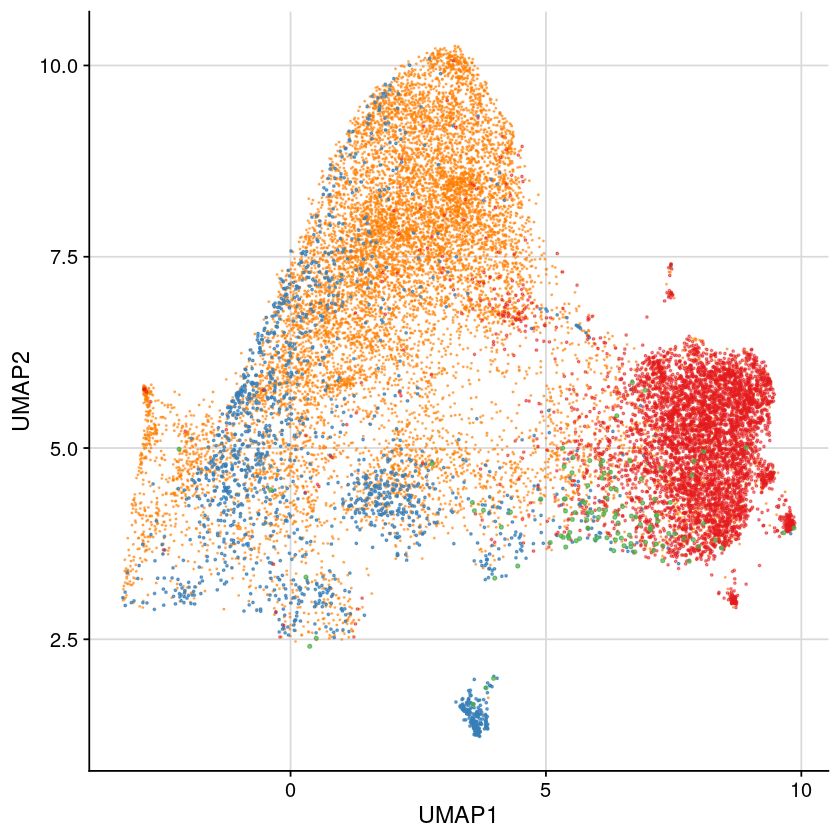

In [11]:
###
dat = tribble(
    ~Group,         ~Color,
    "Enhancer",     "#ff7f00",
    "Silencer",     "#377eb8",
    "TSS:Enhancer", "#e41a1c",
    "TSS:Silencer", "#4daf4a"
)
dat_group_color = dat
lst_group_color = split(dat$Color, dat$Group)

###
dat = dat_region_umap_group
lst = split(dat, dat$Group)
vec = c("Enhancer", "Silencer", "TSS:Enhancer", "TSS:Silencer")

###
dat1 = lst[[vec[1]]]
dat2 = lst[[vec[2]]]
dat3 = lst[[vec[3]]]
dat4 = lst[[vec[4]]]
txt_color1 = lst_group_color[[vec[1]]]
txt_color2 = lst_group_color[[vec[2]]]
txt_color3 = lst_group_color[[vec[3]]]
txt_color4 = lst_group_color[[vec[4]]]

###
gpt = ggplot() +
    geom_point(data = dat1, aes(x=UMAP1, y=UMAP2), color=txt_color1, size = 0.2, alpha = 0.5) +
    geom_point(data = dat2, aes(x=UMAP1, y=UMAP2), color=txt_color2, size = 0.4, alpha = 0.7) +
    geom_point(data = dat3, aes(x=UMAP1, y=UMAP2), color=txt_color3, size = 0.4, alpha = 0.5) +
    geom_point(data = dat4, aes(x=UMAP1, y=UMAP2), color=txt_color4, size = 0.8, alpha = 0.7) +
    theme_cowplot() +
    background_grid()

print(gpt)


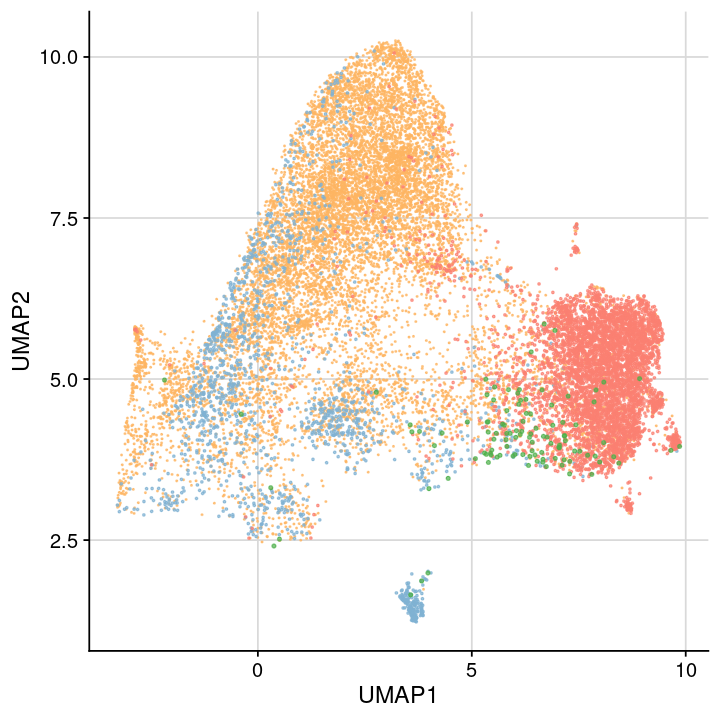

In [12]:
###
dat = tribble(
    ~Group,         ~Color,
    "Enhancer",     "#fdb462",
    "Silencer",     "#80b1d3",
    "TSS:Enhancer", "#fb8072",
    "TSS:Silencer", "#4daf4a"
)
dat_group_color = dat
lst_group_color = split(dat$Color, dat$Group)

###
dat = dat_region_umap_group
lst = split(dat, dat$Group)
vec = c("Enhancer", "Silencer", "TSS:Enhancer", "TSS:Silencer")

###
dat1 = lst[[vec[1]]]
dat2 = lst[[vec[2]]]
dat3 = lst[[vec[3]]]
dat4 = lst[[vec[4]]]
txt_color1 = lst_group_color[[vec[1]]]
txt_color2 = lst_group_color[[vec[2]]]
txt_color3 = lst_group_color[[vec[3]]]
txt_color4 = lst_group_color[[vec[4]]]

###
gpt = ggplot() +
    geom_point(data = dat1, aes(x=UMAP1, y=UMAP2), color=txt_color1, size = 0.2, alpha = 0.7) +
    geom_point(data = dat2, aes(x=UMAP1, y=UMAP2), color=txt_color2, size = 0.4, alpha = 0.7) +
    geom_point(data = dat3, aes(x=UMAP1, y=UMAP2), color=txt_color3, size = 0.4, alpha = 0.7) +
    geom_point(data = dat4, aes(x=UMAP1, y=UMAP2), color=txt_color4, size = 0.8, alpha = 0.7) +
    theme_cowplot() +
    background_grid()

###
options(repr.plot.height = 6, repr.plot.width = 6)
print(gpt)

In [13]:
dat = tribble(
    ~Group,         ~Color,
    "Enhancer",     "#fdb462",
    "Silencer",     "#80b1d3",
    "TSS:Enhancer", "#fb8072",
    "TSS:Silencer", "#4daf4a"
)
vec_group_color = setNames(dat$Color, dat$Group)
vec_group_color

Enhancer     Silencer TSS:Enhancer TSS:Silencer 
   "#fdb462"    "#80b1d3"    "#fb8072"    "#4daf4a"

In [14]:
head(dat1)

UMAP1,UMAP2,Region,Chrom,ChromStart,ChromEnd,Group
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>
5.6008990,6.791666,chr1:100362769-100363401,chr1,100362769,100363401,Enhancer
1.9779091,7.495390,chr1:100400445-100400762,chr1,100400445,100400762,Enhancer
4.4463415,7.605491,chr1:1005094-1005553,chr1,1005094,1005553,Enhancer
0.9342694,7.031426,chr1:100810387-100811206,chr1,100810387,100811206,Enhancer
0.8953547,7.240601,chr1:101198803-101199513,chr1,101198803,101199513,Enhancer
2.3745990,9.759831,chr1:101283354-101284286,chr1,101283354,101284286,Enhancer


Add legend
* https://www.tidyverse.org/blog/2024/02/ggplot2-3-5-0-legends/
* https://github.com/tidyverse/ggplot2/issues/5766

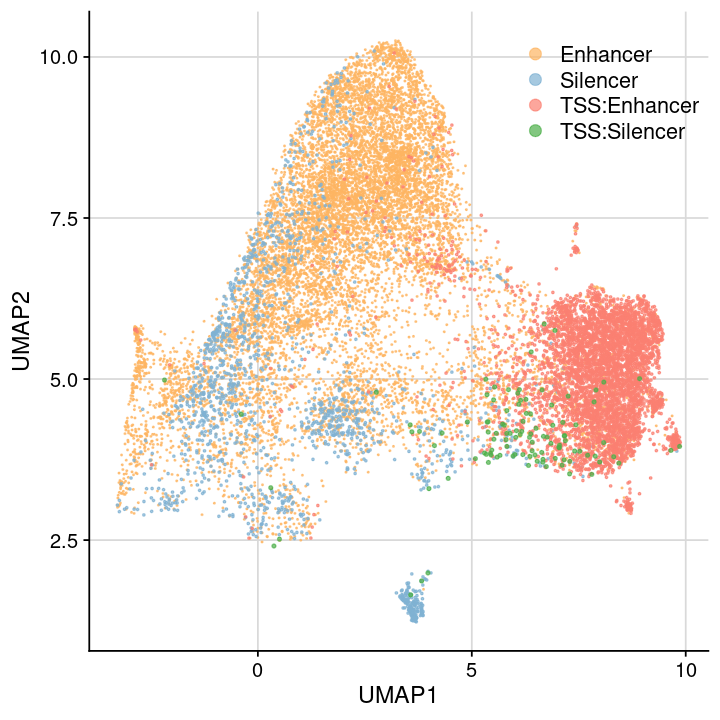

In [104]:
###
dat = tribble(
    ~Group,         ~Color,
    "Enhancer",     "#fdb462",
    "Silencer",     "#80b1d3",
    "TSS:Enhancer", "#fb8072",
    "TSS:Silencer", "#4daf4a"
)
dat_group_color = dat
lst_group_color = split(dat$Color, dat$Group)
vec_group_color = setNames(dat$Color, dat$Group)

###
dat = dat_region_umap_group
lst = split(dat, dat$Group)
vec = c("Enhancer", "Silencer", "TSS:Enhancer", "TSS:Silencer")

###
dat1 = lst[[vec[1]]]
dat2 = lst[[vec[2]]]
dat3 = lst[[vec[3]]]
dat4 = lst[[vec[4]]]
txt_color1 = lst_group_color[[vec[1]]]
txt_color2 = lst_group_color[[vec[2]]]
txt_color3 = lst_group_color[[vec[3]]]
txt_color4 = lst_group_color[[vec[4]]]

###
gpt = ggplot() +
    geom_point(data = dat1, aes(x=UMAP1, y=UMAP2, color=vec[1]), size = 0.2, alpha = 0.7) +
    geom_point(data = dat2, aes(x=UMAP1, y=UMAP2, color=vec[2]), size = 0.4, alpha = 0.7) +
    geom_point(data = dat3, aes(x=UMAP1, y=UMAP2, color=vec[3]), size = 0.4, alpha = 0.7) +
    geom_point(data = dat4, aes(x=UMAP1, y=UMAP2, color=vec[4]), size = 0.8, alpha = 0.7) +
    theme_cowplot() +
    background_grid() +
    scale_colour_manual(
        name = "",
        values = vec_group_color) +
    theme(
        legend.position = "inside",
        legend.position.inside=c(0.7,0.9),
        legend.text = element_text(size=13)
    ) +
    guides(color = guide_legend(override.aes = list(size = 3)))

gpt_fcc_label = gpt

###
options(repr.plot.height = 6, repr.plot.width = 6)
print(gpt)

## Visualize FCC scores

### ATAC-STARR

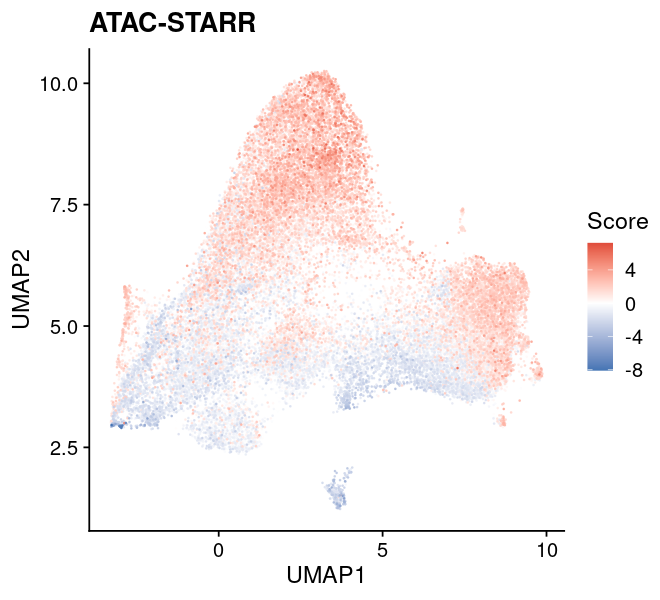

In [16]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = ASTARR) %>%
    dplyr::arrange(abs(Score))

txt = "ATAC-STARR"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

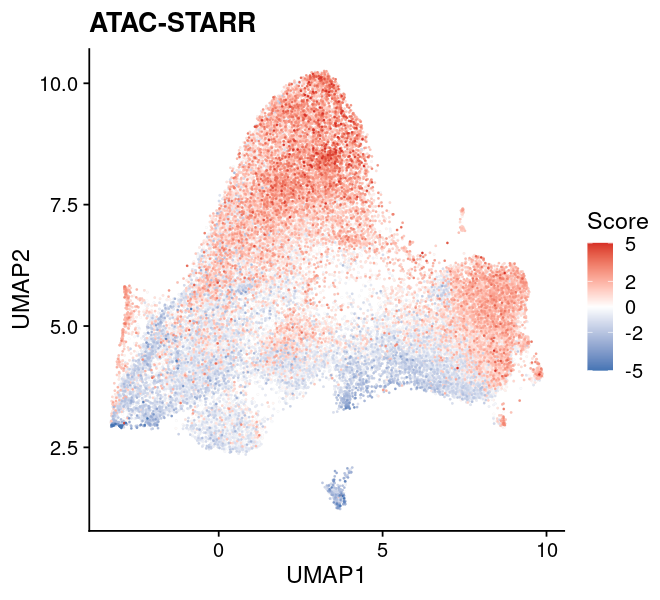

In [17]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-5, 5),
    breaks = c(-5, -2, 0, 2, 5),
    labels = c("-5", "-2", "0", "2", "5"),
    oob    = scales::squish
)


dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = ASTARR) %>%
    dplyr::arrange(abs(Score))

txt = "ATAC-STARR"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2), color="grey90", size = 0.1, alpha = 0.9) +
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score),   size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_fcc_astarr = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

### WHG-STARR

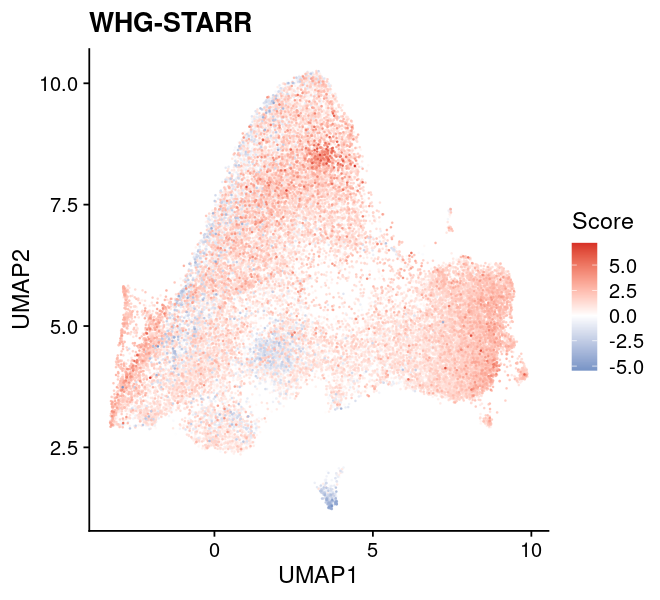

In [18]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = WSTARR) %>%
    dplyr::arrange(abs(Score))

txt = "WHG-STARR"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

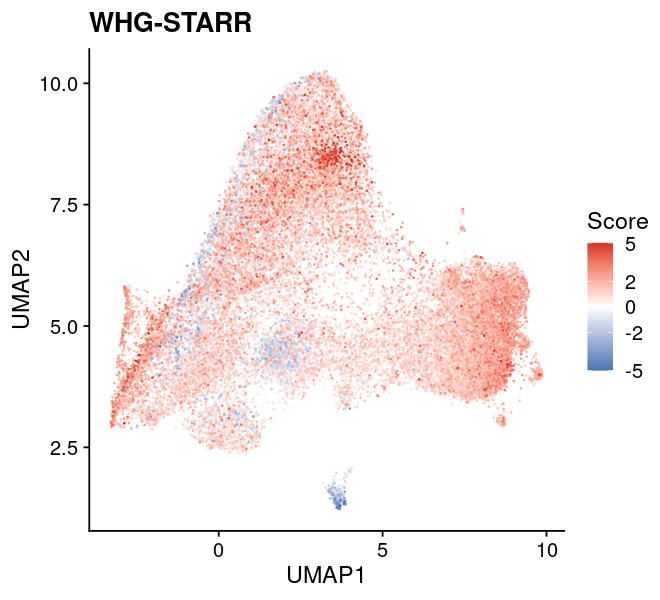

In [19]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-5, 5),
    breaks = c(-5, -2, 0, 2, 5),
    labels = c("-5", "-2", "0", "2", "5"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = WSTARR) %>%
    dplyr::arrange(abs(Score))

txt = "WHG-STARR"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_fcc_wstarr = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

### Lenti-MPRA

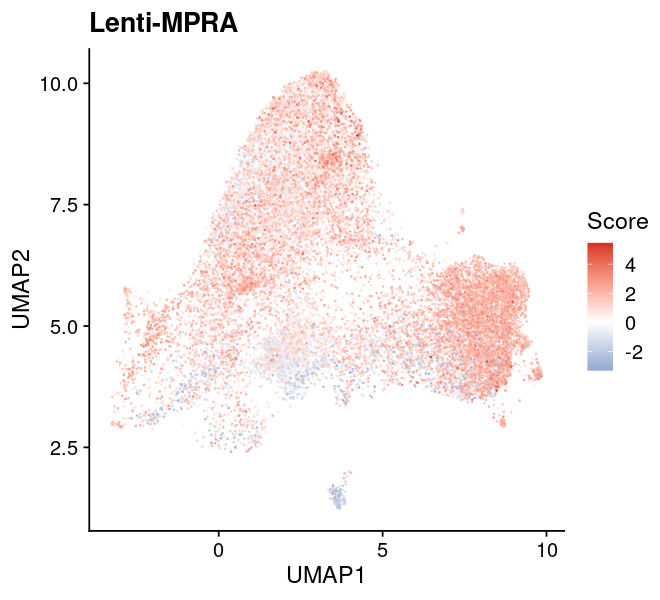

In [20]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = LMPRA) %>%
    dplyr::arrange(abs(Score))

txt = "Lenti-MPRA"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

In [21]:
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = LMPRA)
summary(dat$Score)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-3.30681  0.00000  0.05794  0.46514  1.10586  5.45359 

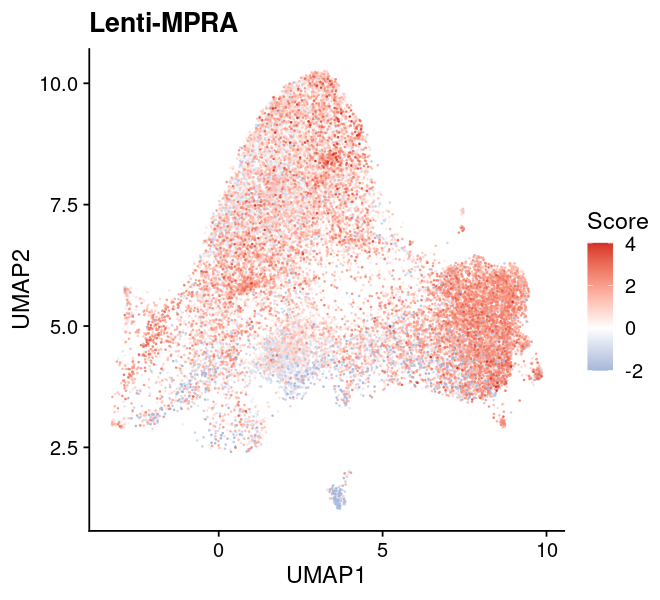

In [22]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-2, 4),
    breaks = c(-2, 0, 2, 4),
    labels = c("-2", "0", "2", "4"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = LMPRA) %>%
    dplyr::arrange(abs(Score))

txt = "Lenti-MPRA"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_fcc_lmpra = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

## Tiling MPRA

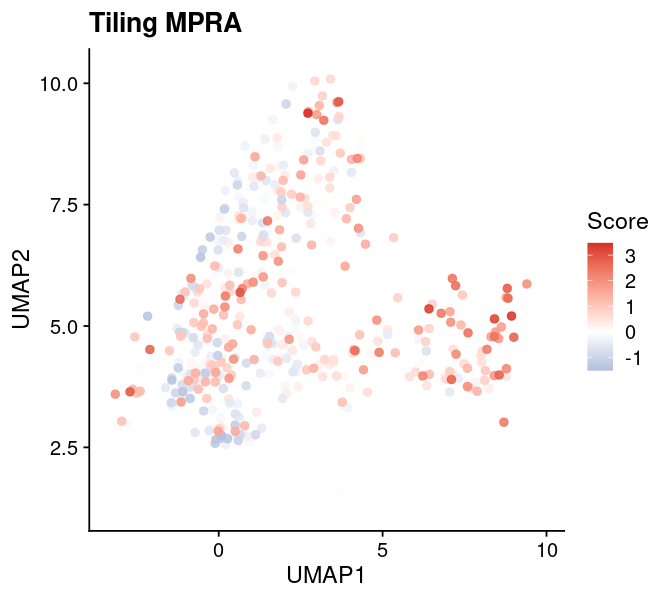

In [23]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = TMPRA) %>%
    dplyr::arrange(abs(Score))

txt = "Tiling MPRA"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 2, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

In [24]:
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = TMPRA)
summary(dat$Score)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-1.520315  0.000000  0.000000  0.005731  0.000000  3.474341 

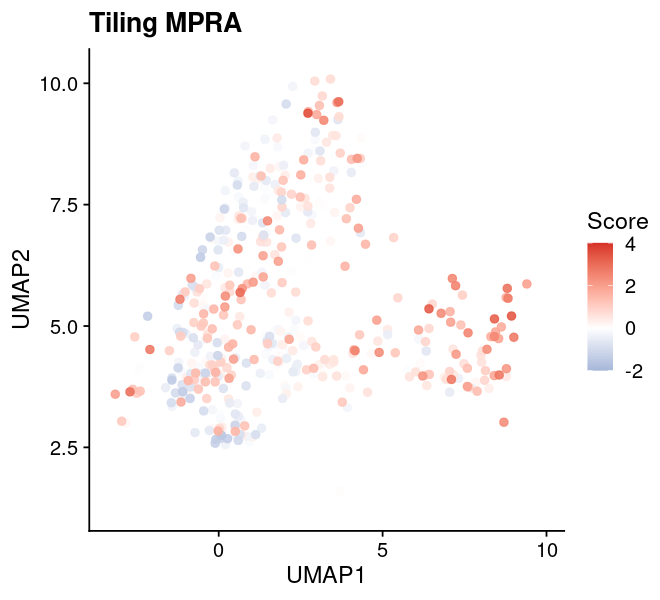

In [25]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-2, 4),
    breaks = c(-2, 0, 2, 4),
    labels = c("-2", "0", "2", "4"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = TMPRA) %>%
    dplyr::arrange(abs(Score))

txt = "Tiling MPRA"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 2.0, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_fcc_tmpra = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

## CRISPRi-HCRFF

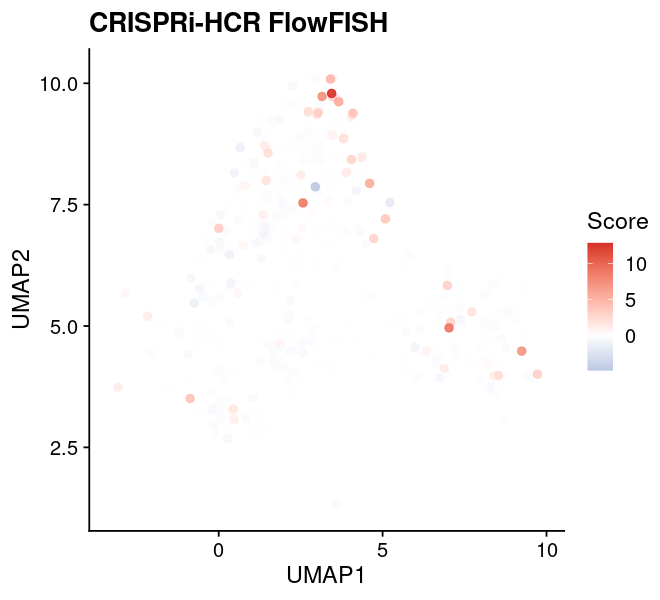

In [26]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-HCRFF`) %>%
    dplyr::arrange(abs(Score))

txt = "CRISPRi-HCR FlowFISH"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 2, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

In [27]:
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = `CRISPRi-HCRFF`)
summary(dat$Score)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-4.856980  0.000000  0.000000  0.001548  0.000000 12.812706 

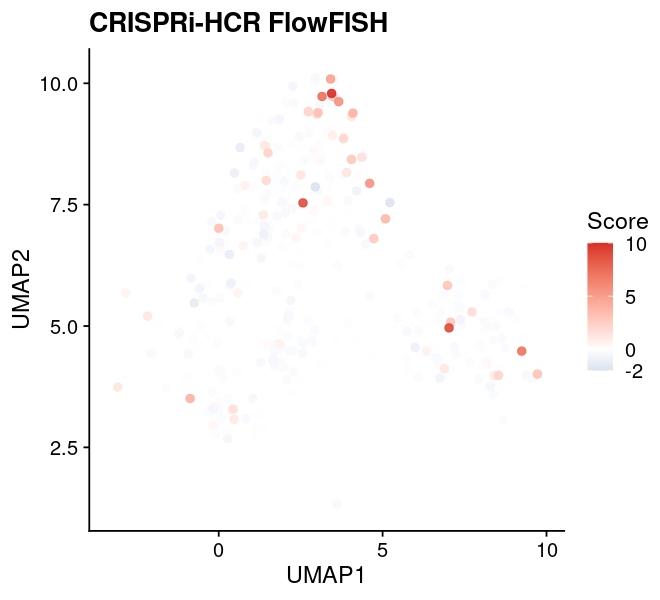

In [28]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-2, 10),
    breaks = c(-2, 0, 5, 10),
    labels = c("-2", "0", "5", "10"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-HCRFF`) %>%
    dplyr::arrange(abs(Score))

txt = "CRISPRi-HCR FlowFISH"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 2.0, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_fcc_chcrff = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

## CRISPRi-Growth

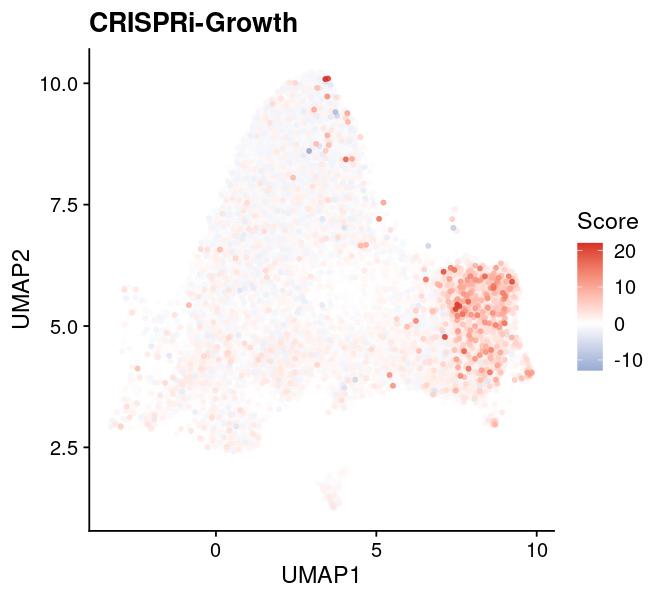

In [29]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-Growth`) %>%
    dplyr::arrange(abs(Score))

txt = "CRISPRi-Growth"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

In [30]:
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = `CRISPRi-Growth`)
summary(dat$Score)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-12.8729  -0.3324   0.0000   0.1402   0.3865  22.0365 

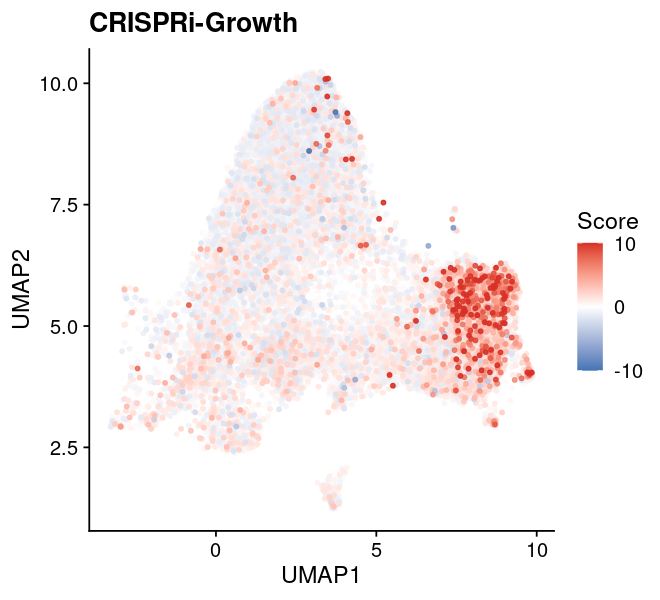

In [31]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-10, 10),
    breaks = c(-10, 0, 10),
    labels = c("-10", "0", "10"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-Growth`) %>%
    dplyr::arrange(abs(Score))

txt = "CRISPRi-Growth"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

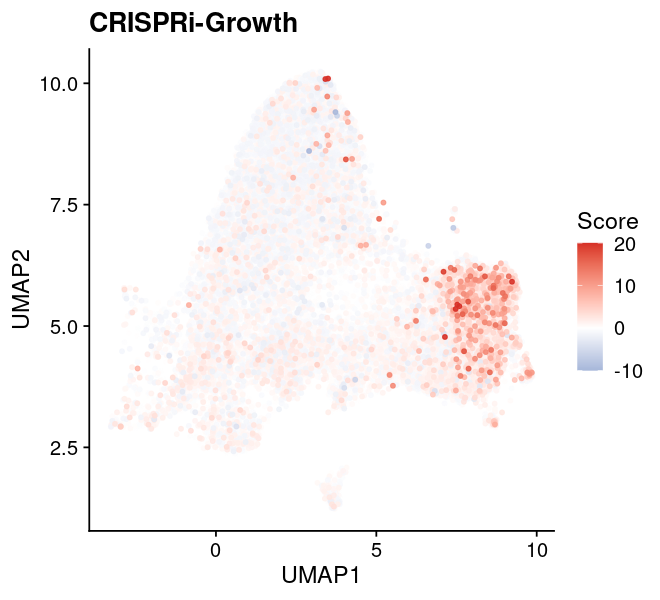

In [32]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
    limits = c(-10, 20),
    breaks = c(-10, 0, 10, 20),
    labels = c("-10", "0", "10", "20"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-Growth`) %>%
    dplyr::arrange(abs(Score))

txt = "CRISPRi-Growth"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_fcc_cgrowth = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

## Combine

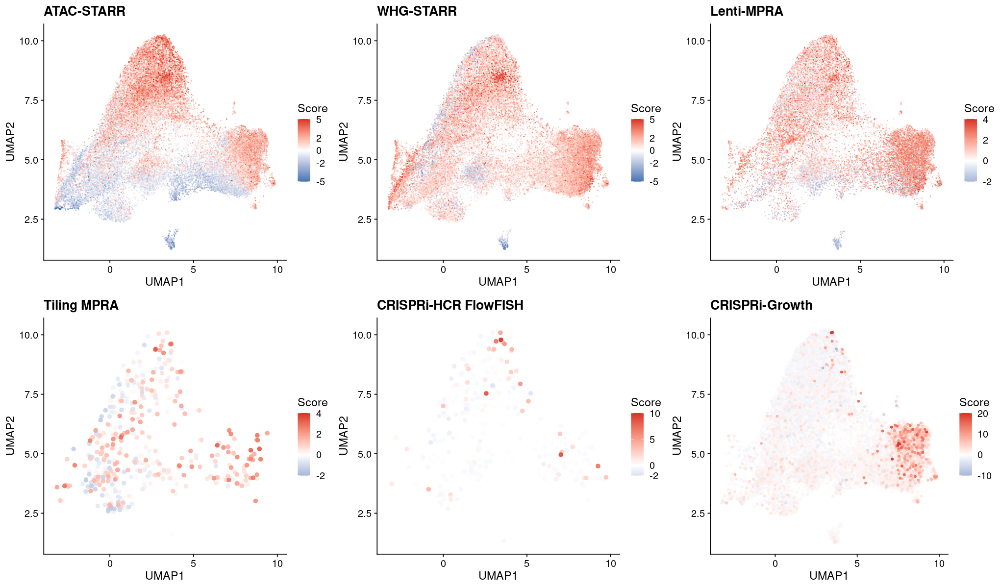

In [33]:
lst = list(
    gpt_fcc_astarr,
    gpt_fcc_wstarr,
    gpt_fcc_lmpra,
    gpt_fcc_tmpra,
    gpt_fcc_chcrff,
    gpt_fcc_cgrowth
)

options(repr.plot.height = 10, repr.plot.width = 17)
plot_grid(plotlist = lst, nrow = 2)

## ChIP-seq

In [120]:
fun_scale_minmax <- function(x, na.rm = TRUE) {
    return((x - min(x)) / (max(x) - min(x)))
}

### POLR2

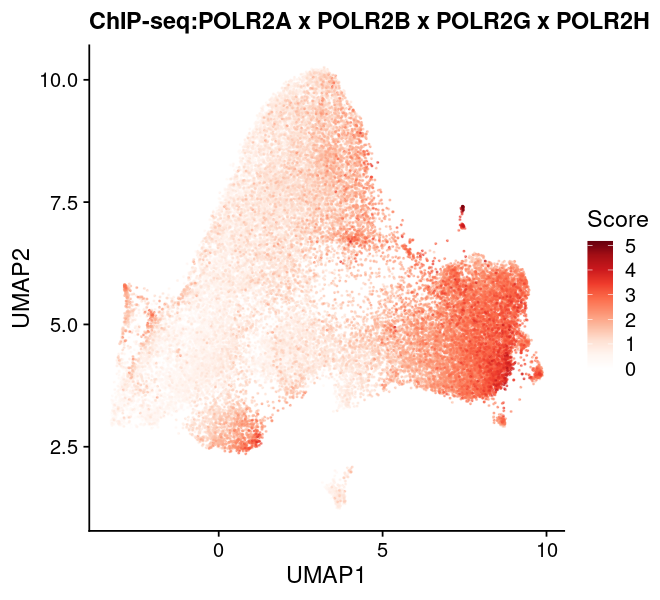

In [121]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
theme_text  = theme(plot.title = element_text(size=14))

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (POLR2A * POLR2B * POLR2G * POLR2H)^(1/4))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "ChIP-seq:POLR2A x POLR2B x POLR2G x POLR2H") +
    theme_color +
    theme_text
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

### Active promoter

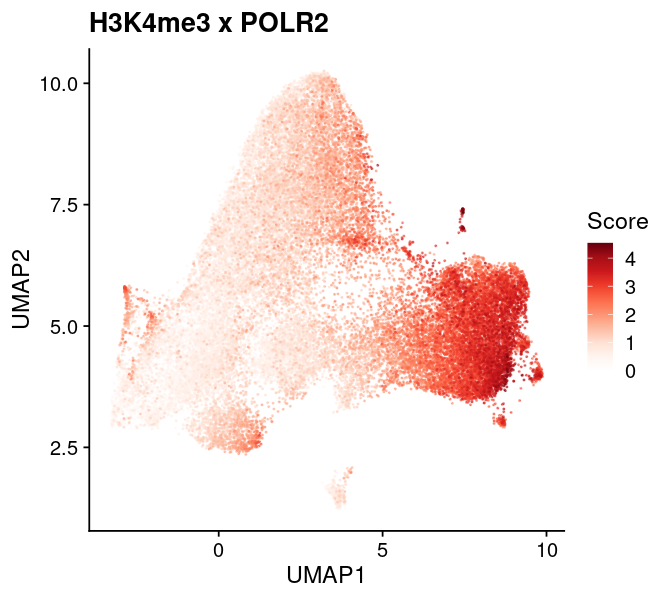

In [148]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
theme_text  = theme(plot.title = element_text(size=16))

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (POLR2A * POLR2B * POLR2G * POLR2H * H3K4me3)^(1/5))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "H3K4me3 x POLR2") +
    theme_color +
    theme_text

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

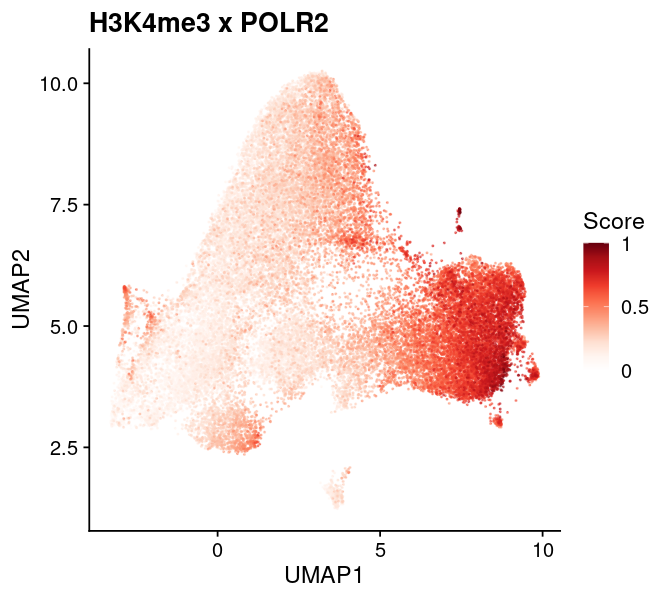

In [170]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(
    colours = vec_txt_colors,
    limits  = c(0, 1),
    breaks  = c(0, 0.5, 1),
    labels  = c("0", "0.5", "1"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = (POLR2A * POLR2B * POLR2G * POLR2H * H3K4me3)^(1/5)) %>%
    dplyr::mutate(Score = fun_scale_minmax(Score)) %>% 
    dplyr::arrange(Score)

txt = "H3K4me3 x POLR2"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_chip_promoter = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

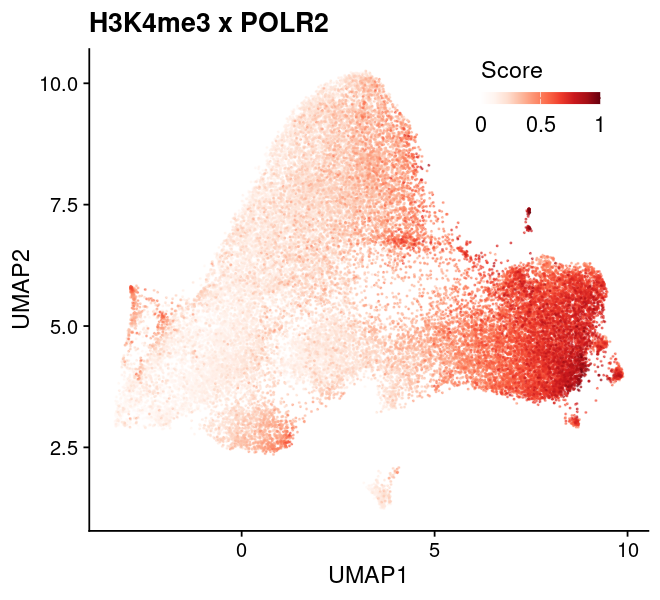

In [176]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(
    colours = vec_txt_colors,
    limits  = c(0, 1),
    breaks  = c(0, 0.5, 1),
    labels  = c("0", "0.5", "1"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% 
    dplyr::mutate(Score = (POLR2A * POLR2B * POLR2G * POLR2H * H3K4me3)^(1/5)) %>%
    dplyr::mutate(Score = fun_scale_minmax(Score)) %>% 
    dplyr::arrange(Score)

txt = "H3K4me3 x POLR2"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color +
    guides(color = guide_colorbar(
        direction = "horizontal",   # Make colorbar horizontal
        barwidth = 5,              # Adjust width
        barheight = 0.5,           # Adjust height
        title.position = "top"     # Position the title above
    )) +
    theme(
        legend.position = "inside",
        legend.position.inside=c(0.7,0.9),
        legend.text = element_text(size=13)
    )

gpt_chip_promoter_hscale = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

### CTCF

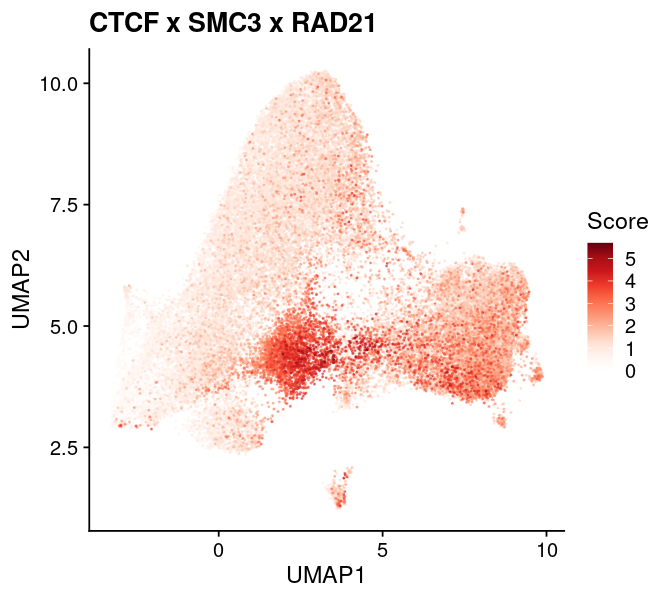

In [150]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
theme_text  = theme(plot.title = element_text(size=16))

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (CTCF * SMC3 * RAD21)^(1/3))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "CTCF x SMC3 x RAD21") +
    theme_color +
    theme_text

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

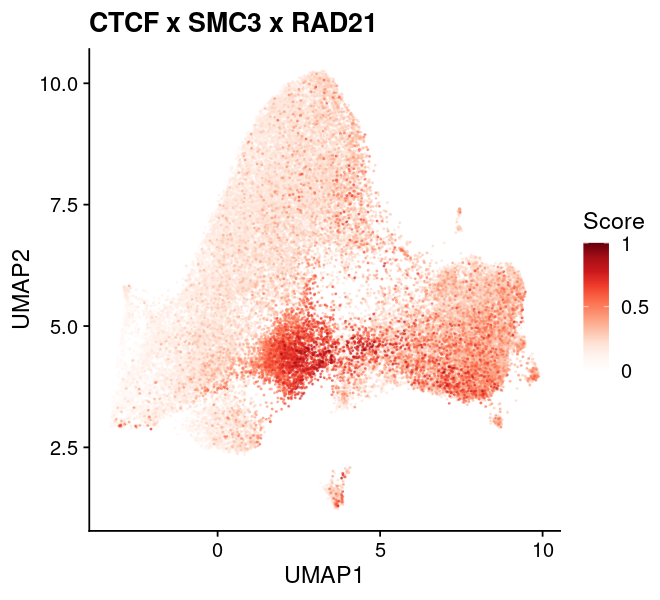

In [151]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(
    colours = vec_txt_colors,
    limits  = c(0, 1),
    breaks  = c(0, 0.5, 1),
    labels  = c("0", "0.5", "1"),
    oob    = scales::squish
)

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (CTCF * SMC3 * RAD21)^(1/3))

dat = dat %>%
    dplyr::mutate(Score = fun_scale_minmax(Score)) %>% 
    dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "CTCF x SMC3 x RAD21") +
    theme_color +
    theme_text

gpt_chip_ctcf = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

## REST

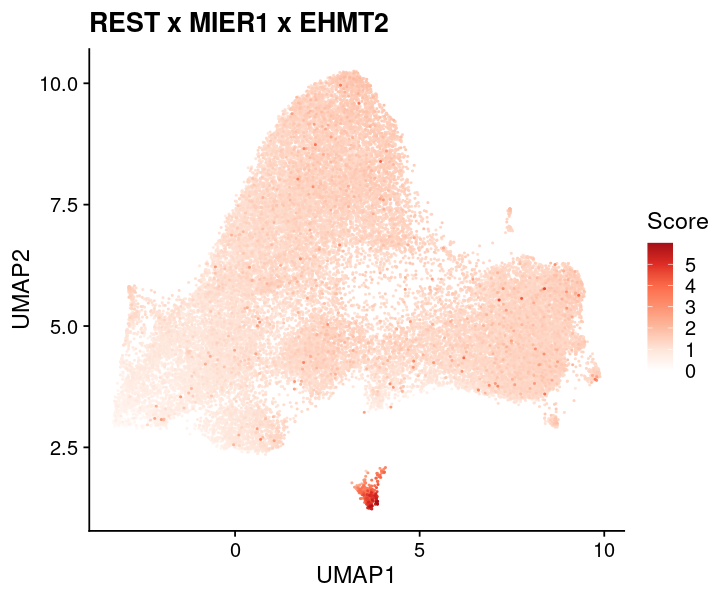

In [152]:
vec = brewer.pal("Reds", n = 6)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
    
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (REST * MIER1 * EHMT2)^(1/3))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    #geom_point(data = dat, aes(x=UMAP1, y=UMAP2), color="grey30", size = 0.1, alpha = 0.1) + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 1) +
    theme_cowplot() +
    labs(title = "REST x MIER1 x EHMT2") +
    theme_color

gpt_chip_rest = gpt

options(repr.plot.height = 5, repr.plot.width = 6)
print(gpt)

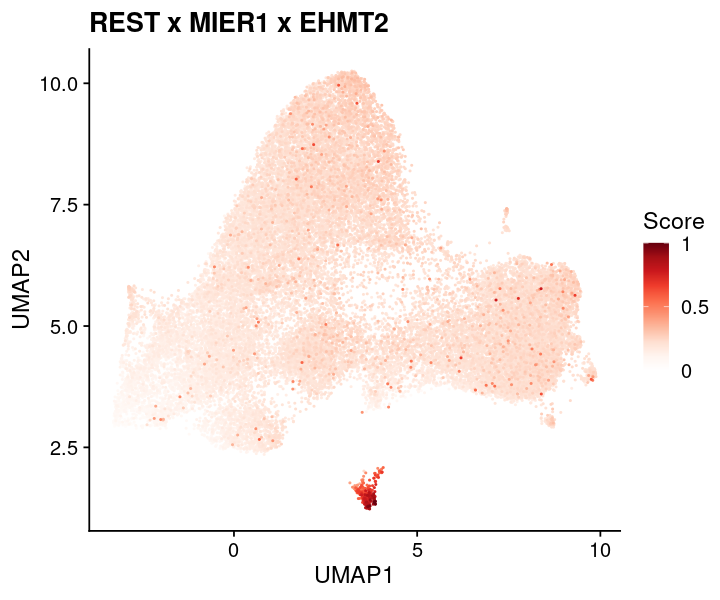

In [153]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(
    colours = vec_txt_colors,
    limits  = c(0, 1),
    breaks  = c(0, 0.5, 1),
    labels  = c("0", "0.5", "1"),
    oob    = scales::squish
)
    
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (REST * MIER1 * EHMT2)^(1/3))

dat = dat %>%
    dplyr::mutate(Score = fun_scale_minmax(Score)) %>% 
    dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 1) +
    theme_cowplot() +
    labs(title = "REST x MIER1 x EHMT2") +
    theme_color

gpt_chip_rest = gpt

options(repr.plot.height = 5, repr.plot.width = 6)
print(gpt)

## Enhancer

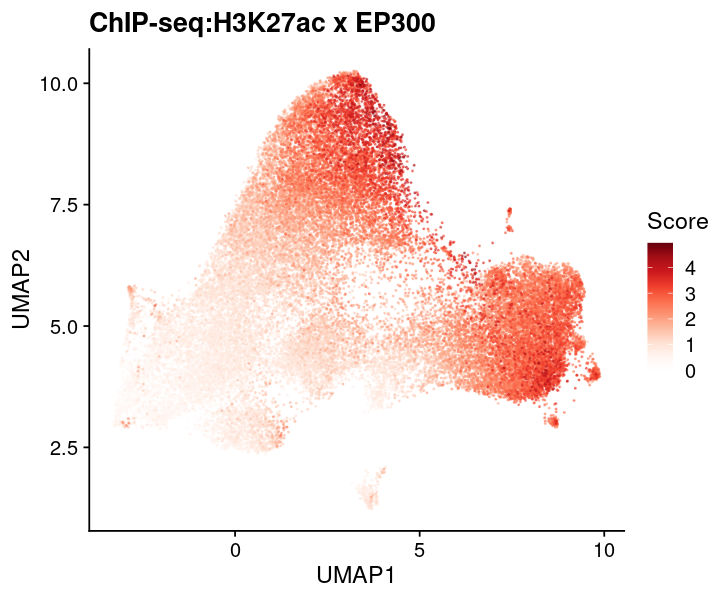

In [154]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
theme_text  = theme(plot.title = element_text(size=16))

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (H3K27ac * EP300)^(1/2))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "ChIP-seq:H3K27ac x EP300") +
    theme_color +
    theme_text

options(repr.plot.height = 5, repr.plot.width = 6)
print(gpt)

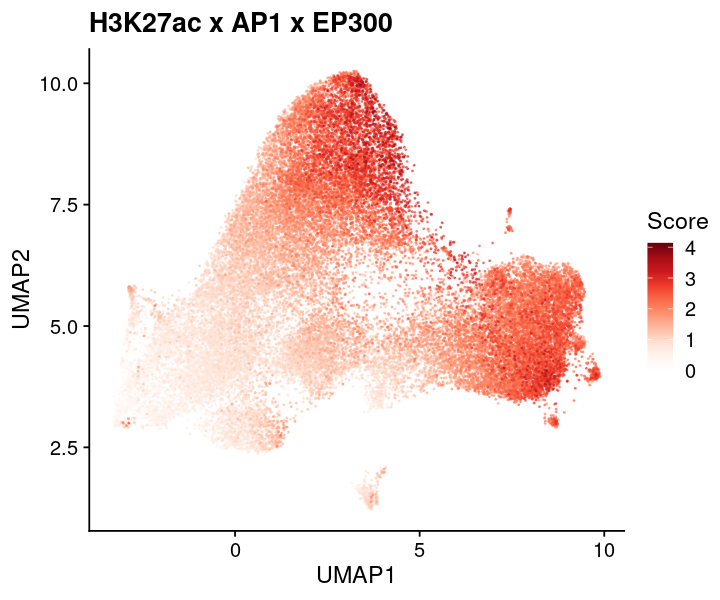

In [155]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
theme_text  = theme(plot.title = element_text(size=16))

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (JUN * JUNB * JUND * FOSL1)^(1/4))
dat = dat %>% dplyr::mutate(Score = (Score * H3K27ac * EP300)^(1/3))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "H3K27ac x AP1 x EP300") +
    theme_color +
    theme_text

options(repr.plot.height = 5, repr.plot.width = 6)
print(gpt)

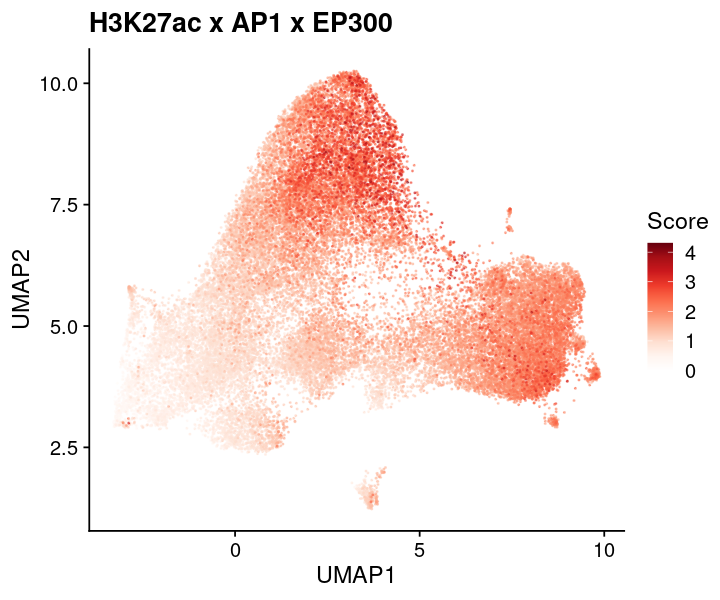

In [156]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (JUN * JUNB * JUND * FOSL1 * H3K27ac * EP300)^(1/6))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "H3K27ac x AP1 x EP300") +
    theme_color

options(repr.plot.height = 5, repr.plot.width = 6)
print(gpt)

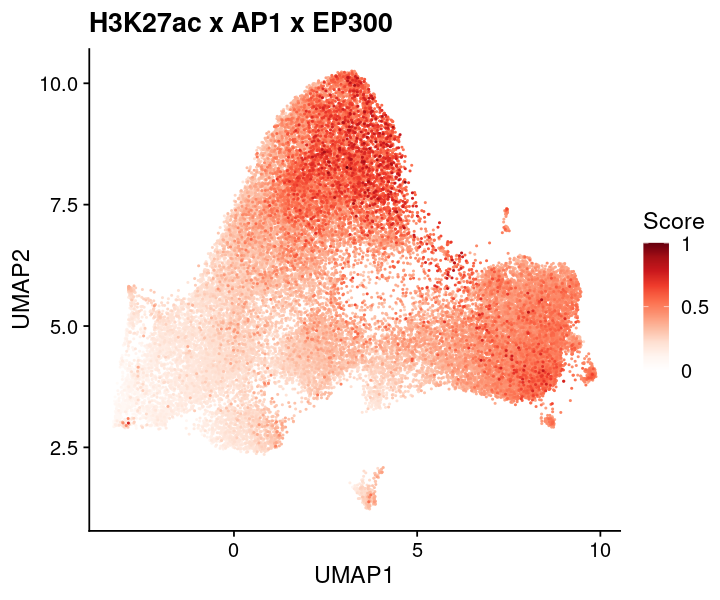

In [157]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(
    colours = vec_txt_colors,
    limits  = c(0, 1),
    breaks  = c(0, 0.5, 1),
    labels  = c("0", "0.5", "1"),
    oob    = scales::squish
)
    
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (JUN * JUNB * JUND * FOSL1 * H3K27ac * EP300)^(1/6))

dat = dat %>%
    dplyr::mutate(Score = fun_scale_minmax(Score)) %>% 
    dplyr::arrange(Score)

txt = "H3K27ac x AP1 x EP300"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 1) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_chip_enhancer = gpt

options(repr.plot.height = 5, repr.plot.width = 6)
print(gpt)

## Bivalent regions

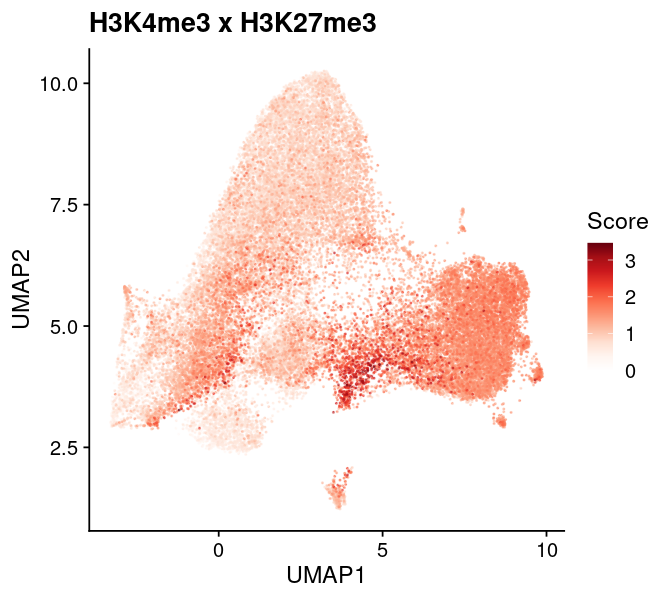

In [158]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(colours = vec_txt_colors)
theme_text  = theme(plot.title = element_text(size=16))

dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (H3K4me3 * H3K27me3)^(1/2))
dat = dat %>% dplyr::arrange(Score)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 0.5) +
    theme_cowplot() +
    labs(title = "H3K4me3 x H3K27me3") +
    theme_color +
    theme_text

gpt_chip_biv = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

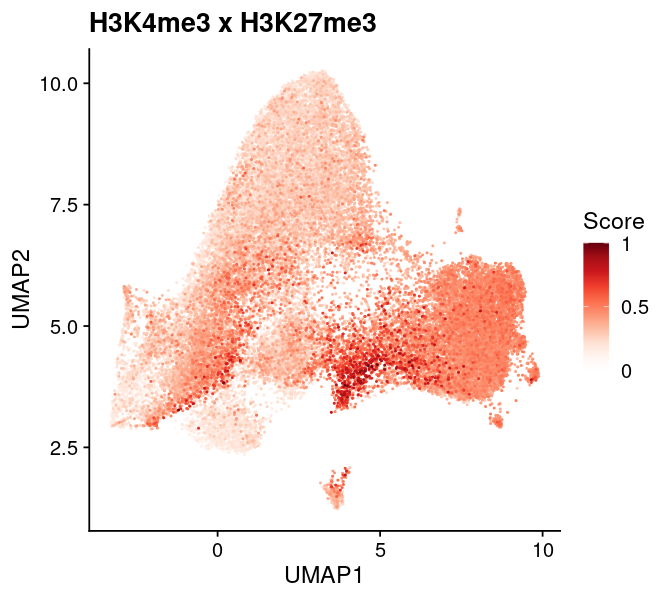

In [159]:
vec = brewer.pal("Reds", n = 9)
vec = c("#FFFFFF", vec)
vec_txt_colors = vec
theme_color = scale_colour_gradientn(
    colours = vec_txt_colors,
    limits  = c(0, 1),
    breaks  = c(0, 0.5, 1),
    labels  = c("0", "0.5", "1"),
    oob    = scales::squish
)
    
dat = dat_region_umap_annot
dat = dat %>% dplyr::mutate(Score = (H3K4me3 * H3K27me3)^(1/2))

dat = dat %>%
    dplyr::mutate(Score = fun_scale_minmax(Score)) %>% 
    dplyr::arrange(Score)

txt = "H3K4me3 x H3K27me3"
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.2, alpha = 1) +
    theme_cowplot() +
    labs(title = txt) +
    theme_color

gpt_chip_biv = gpt

options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

### Combine

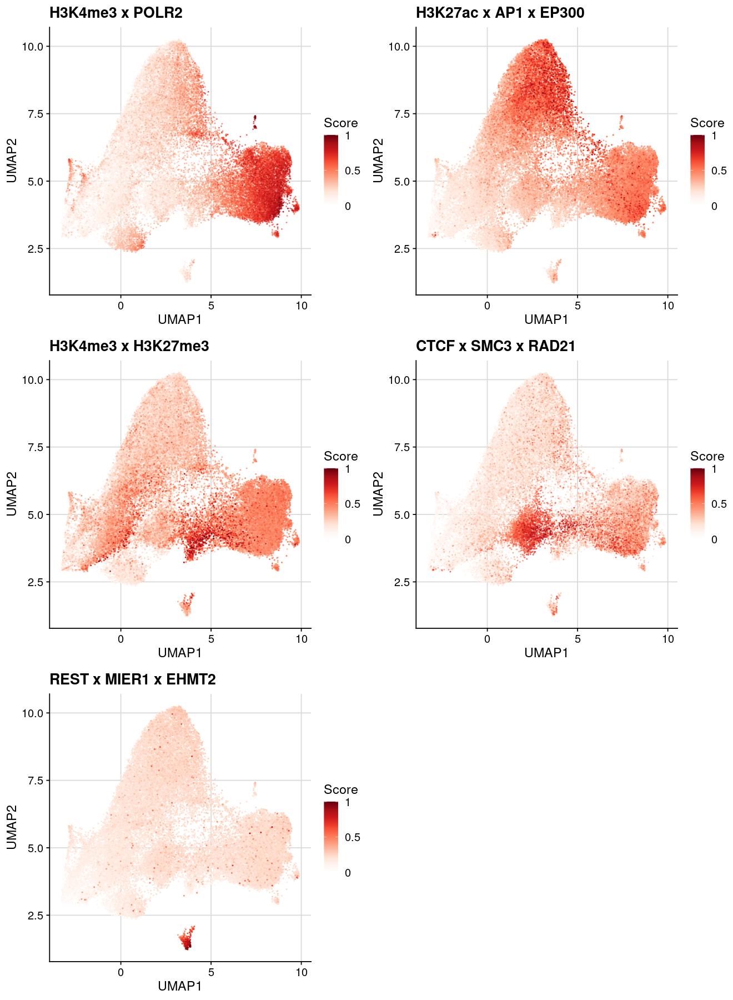

In [160]:
lst = list(
    gpt_chip_promoter,
    gpt_chip_enhancer,
    gpt_chip_biv,
    gpt_chip_ctcf,
    gpt_chip_rest
)
lst = lapply(lst, function(gpt){
    gpt = gpt + background_grid()
    return(gpt)
})

plt_score_chip = plot_grid(plotlist = lst, ncol = 2)

options(repr.plot.height = 15, repr.plot.width = 11)
plt_score_chip

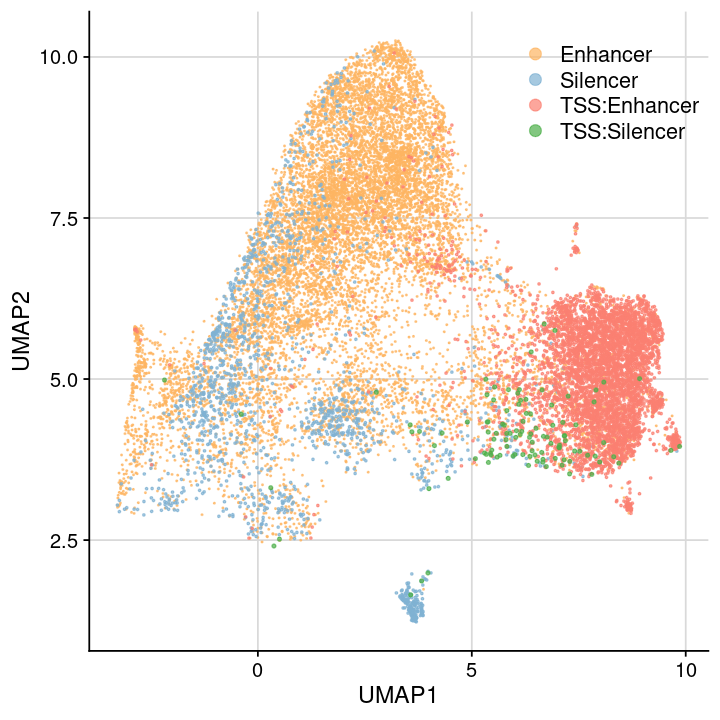

In [177]:
###
dat = tribble(
    ~Group,         ~Color,
    "Enhancer",     "#fdb462",
    "Silencer",     "#80b1d3",
    "TSS:Enhancer", "#fb8072",
    "TSS:Silencer", "#4daf4a"
)
dat_group_color = dat
lst_group_color = split(dat$Color, dat$Group)
vec_group_color = setNames(dat$Color, dat$Group)

###
dat = dat_region_umap_group
lst = split(dat, dat$Group)
vec = c("Enhancer", "Silencer", "TSS:Enhancer", "TSS:Silencer")

###
dat1 = lst[[vec[1]]]
dat2 = lst[[vec[2]]]
dat3 = lst[[vec[3]]]
dat4 = lst[[vec[4]]]
txt_color1 = lst_group_color[[vec[1]]]
txt_color2 = lst_group_color[[vec[2]]]
txt_color3 = lst_group_color[[vec[3]]]
txt_color4 = lst_group_color[[vec[4]]]

###
gpt = ggplot() +
    geom_point(data = dat1, aes(x=UMAP1, y=UMAP2, color=vec[1]), size = 0.2, alpha = 0.7) +
    geom_point(data = dat2, aes(x=UMAP1, y=UMAP2, color=vec[2]), size = 0.4, alpha = 0.7) +
    geom_point(data = dat3, aes(x=UMAP1, y=UMAP2, color=vec[3]), size = 0.4, alpha = 0.7) +
    geom_point(data = dat4, aes(x=UMAP1, y=UMAP2, color=vec[4]), size = 0.8, alpha = 0.7) +
    theme_cowplot() +
    background_grid() +
    scale_colour_manual(
        name = "",
        values = vec_group_color) +
    theme(
        legend.position = "inside",
        legend.position.inside=c(0.7,0.9),
        legend.text = element_text(size=13)
    ) +
    guides(color = guide_legend(override.aes = list(size = 3)))

gpt_fcc_label = gpt

###
options(repr.plot.height = 6, repr.plot.width = 6)
print(gpt)

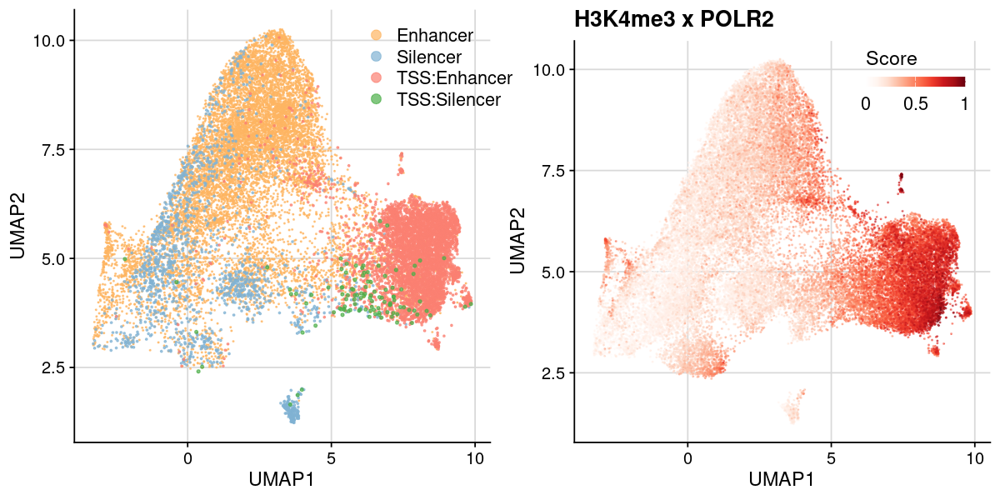

In [183]:
plt_label_fcc = plot_grid(
    gpt_fcc_label, 
    gpt_chip_promoter_hscale + background_grid(),
    nrow = 1
)

options(repr.plot.height = 5, repr.plot.width = 10)
plt_label_fcc

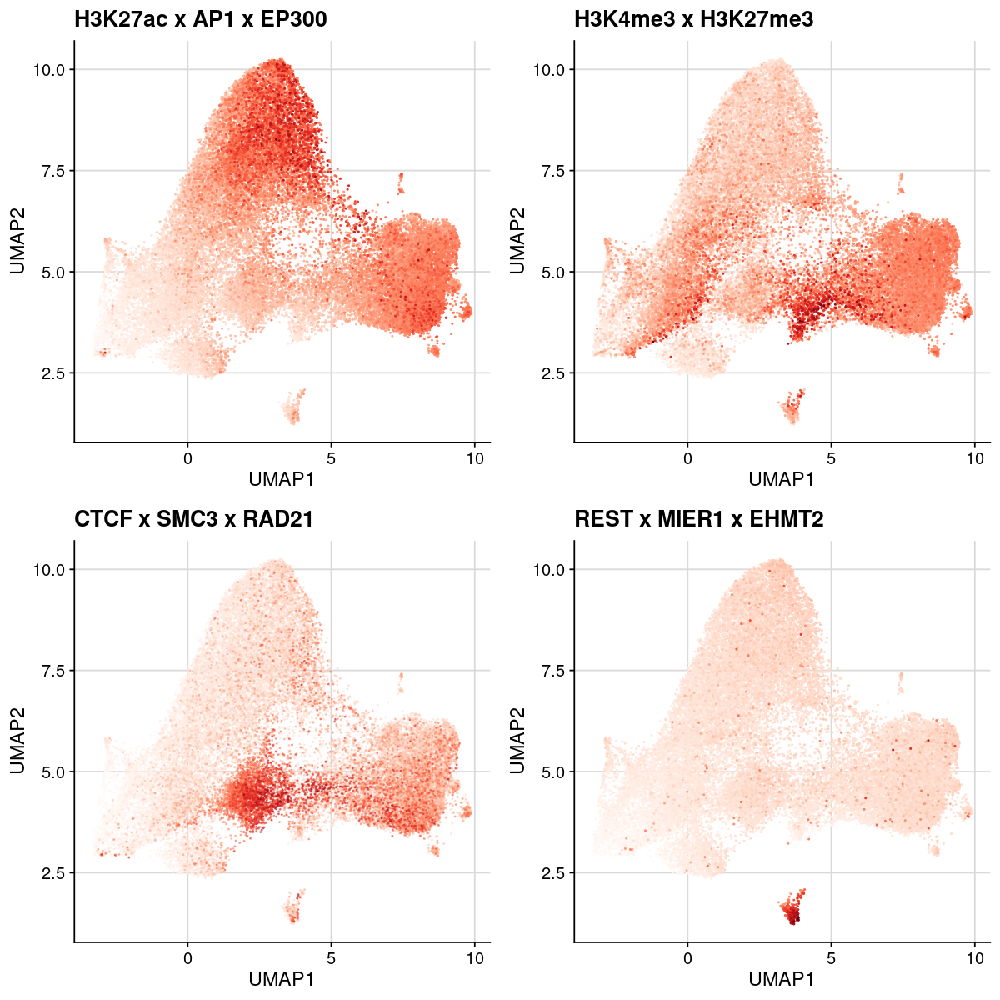

In [184]:
lst = list(
    gpt_chip_enhancer,
    gpt_chip_biv,
    gpt_chip_ctcf,
    gpt_chip_rest
)
lst = lapply(lst, function(gpt){
    gpt = gpt + background_grid() + theme(legend.position = "none")
    return(gpt)
})
plt_score_chip = plot_grid(plotlist = lst, ncol = 2)

options(repr.plot.height = 10, repr.plot.width = 10)
plt_score_chip

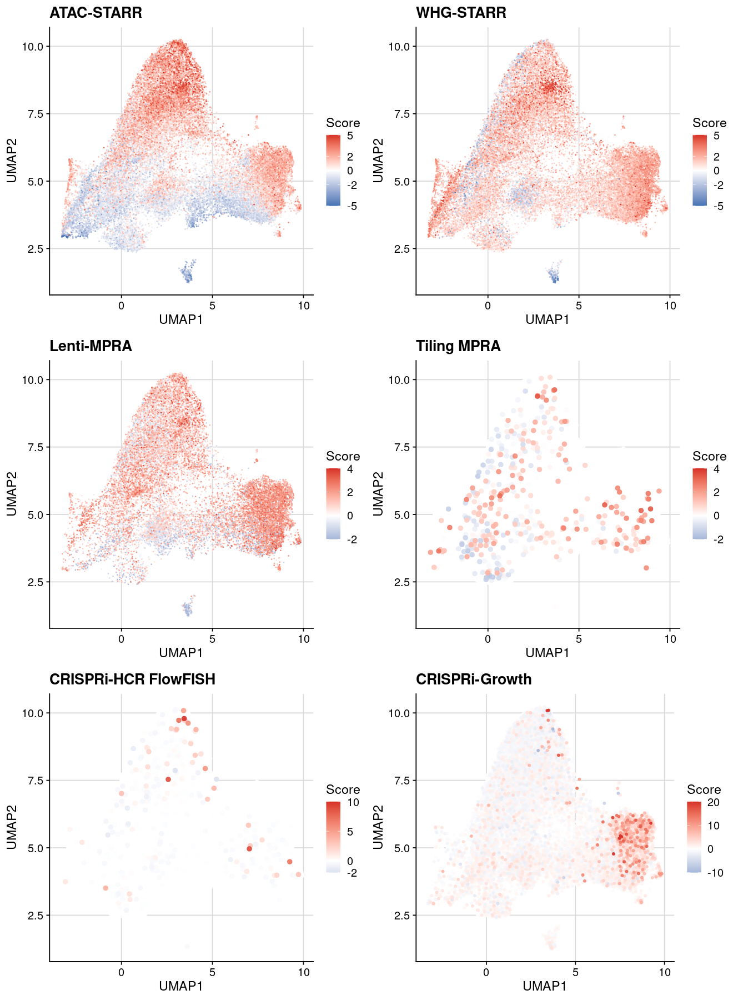

In [185]:
lst = list(
    gpt_fcc_astarr,
    gpt_fcc_wstarr,
    gpt_fcc_lmpra,
    gpt_fcc_tmpra,
    gpt_fcc_chcrff,
    gpt_fcc_cgrowth
)
lst = lapply(lst, function(gpt){
    gpt = gpt + background_grid()
    return(gpt)
})
plt_score_fcc = plot_grid(plotlist = lst, ncol = 2)

options(repr.plot.height = 15, repr.plot.width = 11)
plt_score_fcc

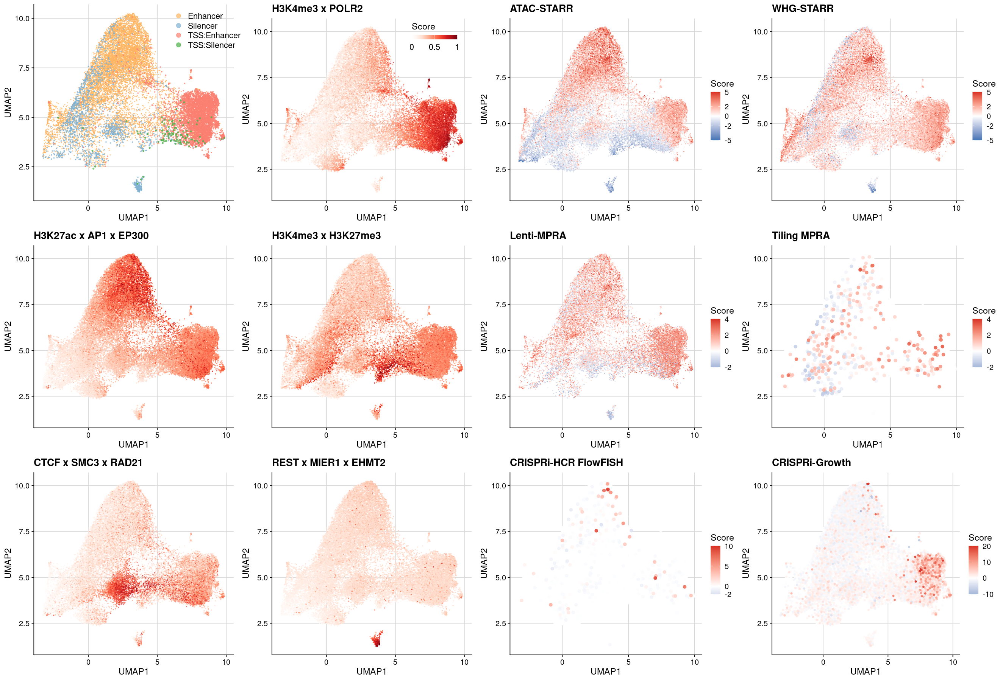

In [186]:
plt = plt_label_fcc
plt = plot_grid(plt, plt_score_chip, ncol=1, rel_heights = c(1, 2))
plt = plot_grid(plt, plt_score_fcc,  nrow=1, rel_widths  = c(1, 1.1))

options(repr.plot.height = 15, repr.plot.width = 22)
print(plt)

In [190]:
save_plot("test.png", plt, base_height = 15, base_width = 22)
save_plot("test.svg", plt, base_height = 15, base_width = 22)

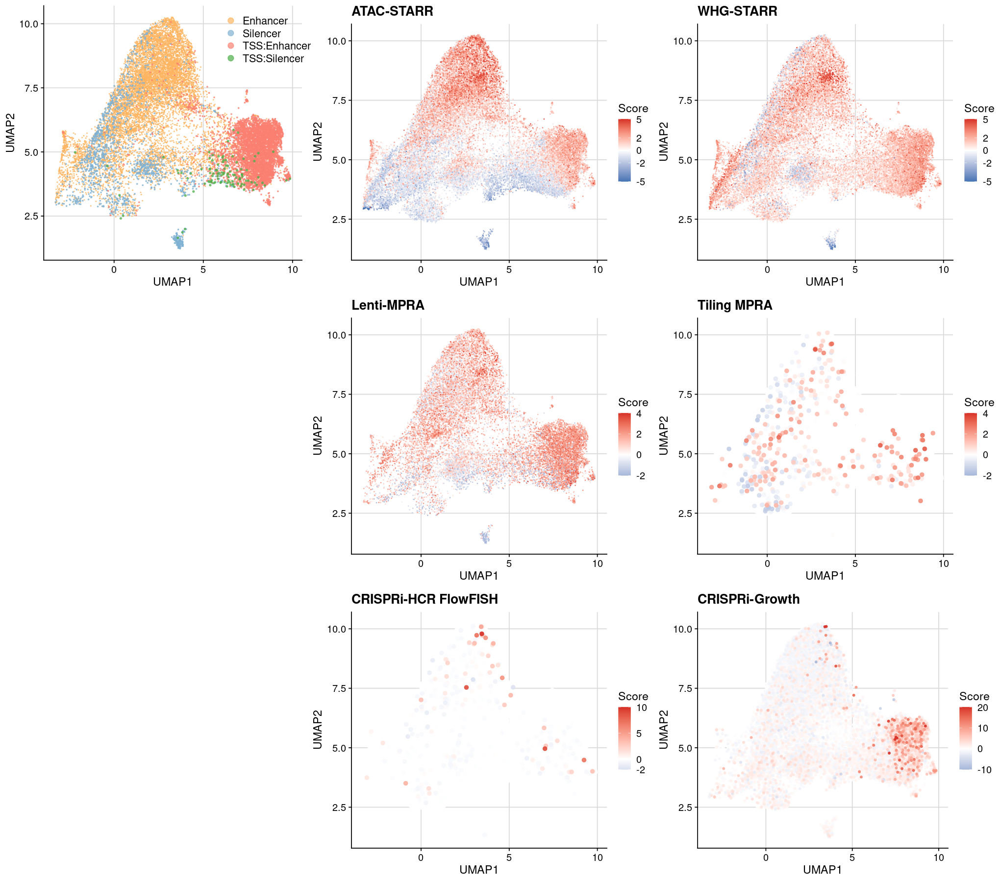

In [54]:
options(repr.plot.height = 15, repr.plot.width = 17)
plot_grid(plt_label_fcc, plt_score_fcc, nrow=1, rel_widths = c(2, 4.5))

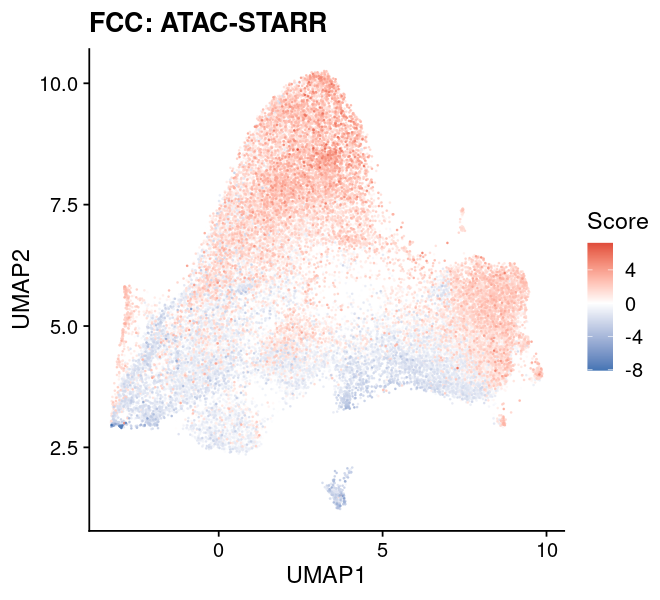

In [167]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
)


dat = dat_umap_chipseq_full_v2
dat = dat %>% 
    dplyr::mutate(Score = ASTARR) %>%
    dplyr::arrange(abs(Score)) %>%
    dplyr::mutate(Region = factor(Region, levels=unique(Region)))
                  
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = "FCC: ATAC-STARR") +
    theme_color
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

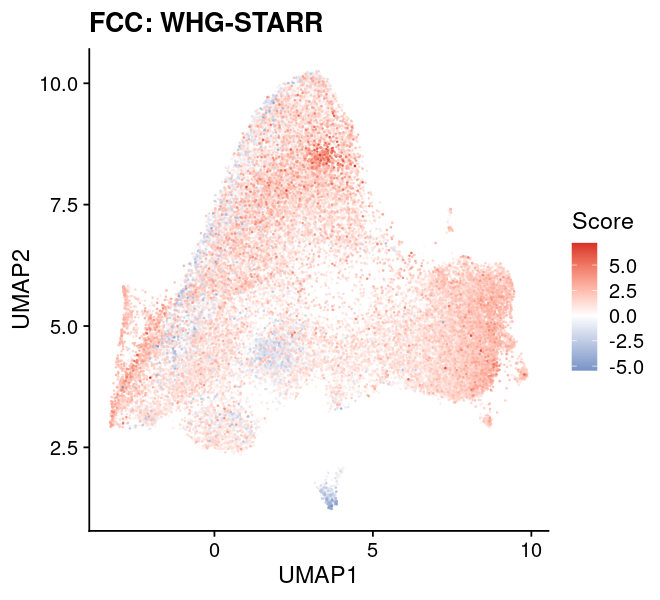

In [166]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
)


dat = dat_umap_chipseq_full_v2
dat = dat %>% 
    dplyr::mutate(Score = WSTARR) %>%
    dplyr::arrange(abs(Score)) %>%
    dplyr::mutate(Region = factor(Region, levels=unique(Region)))
                  
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = "FCC: WHG-STARR") +
    theme_color
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

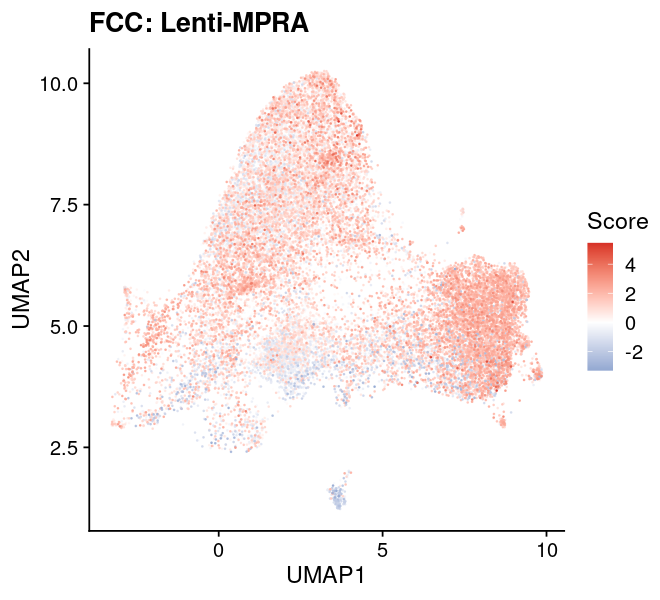

In [168]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
)


dat = dat_umap_chipseq_full_v2
dat = dat %>% 
    dplyr::mutate(Score = LMPRA) %>%
    dplyr::arrange(abs(Score)) %>%
    dplyr::mutate(Region = factor(Region, levels=unique(Region)))
                  
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 0.1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = "FCC: Lenti-MPRA") +
    theme_color
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

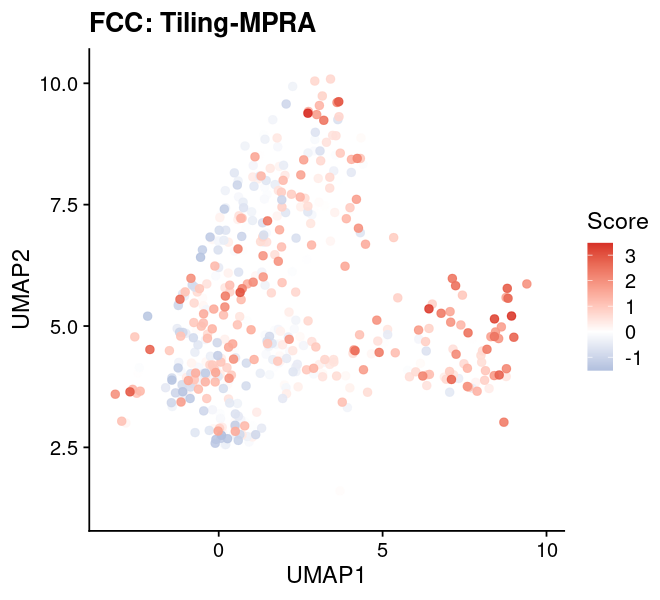

In [170]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
)


dat = dat_umap_chipseq_full_v2
dat = dat %>% 
    dplyr::mutate(Score = TMPRA) %>%
    dplyr::arrange(abs(Score)) %>%
    dplyr::mutate(Region = factor(Region, levels=unique(Region)))
                  
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 2, alpha = 0.9) +
    theme_cowplot() +
    labs(title = "FCC: Tiling-MPRA") +
    theme_color
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

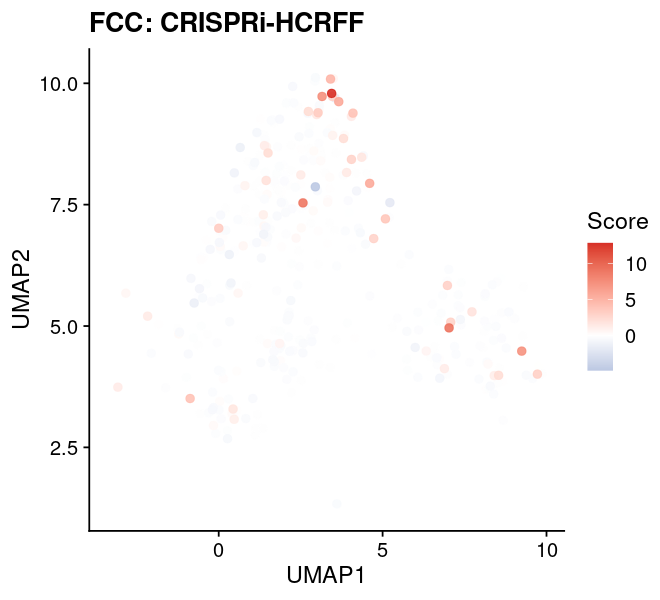

In [169]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
)


dat = dat_umap_chipseq_full_v2
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-HCRFF`) %>%
    dplyr::arrange(abs(Score)) %>%
    dplyr::mutate(Region = factor(Region, levels=unique(Region)))
                  
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 2, alpha = 0.9) +
    theme_cowplot() +
    labs(title = "FCC: CRISPRi-HCRFF") +
    theme_color
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

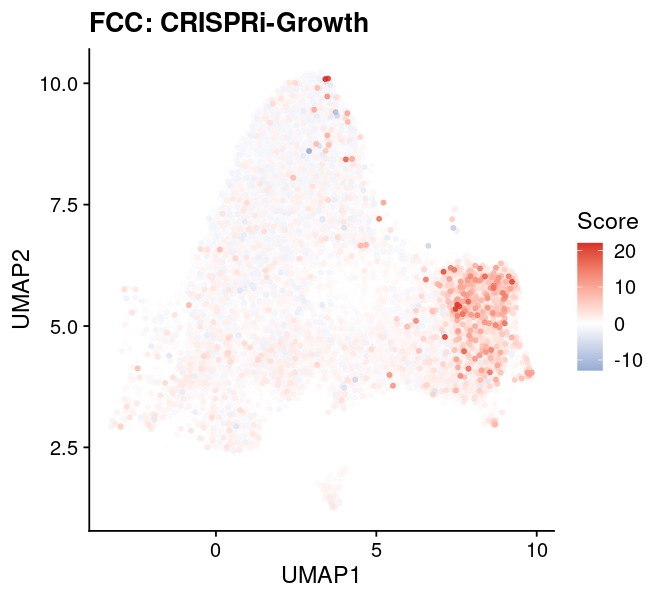

In [171]:
theme_color = scale_colour_gradient2(
    low  = "#4575b4",
    mid  = "white",
    high = "#d73027",
    midpoint = 0,
)


dat = dat_umap_chipseq_full_v2
dat = dat %>% 
    dplyr::mutate(Score = `CRISPRi-Growth`) %>%
    dplyr::arrange(abs(Score)) %>%
    dplyr::mutate(Region = factor(Region, levels=unique(Region)))
                  
gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2,  color=Score), size = 1, alpha = 0.9) +
    theme_cowplot() +
    labs(title = "FCC: CRISPRi-Growth") +
    theme_color
options(repr.plot.height = 5, repr.plot.width = 5.5)
print(gpt)

In [12]:
dat = tribble(
    ~Group,         ~Color,
    "TSS:Enhancer", "#e41a1c",
    "Enhancer",     "#ff7f00",
    "Silencer",     "#ff7f00",
    "TSS:Silencer", "#f781bf"
)
dat_group_color = dat
dat

Group,Color
<chr>,<chr>
TSS:Enhancer,#e41a1c
Enhancer,#ff7f00
Silencer,#ff7f00
TSS:Silencer,#f781bf


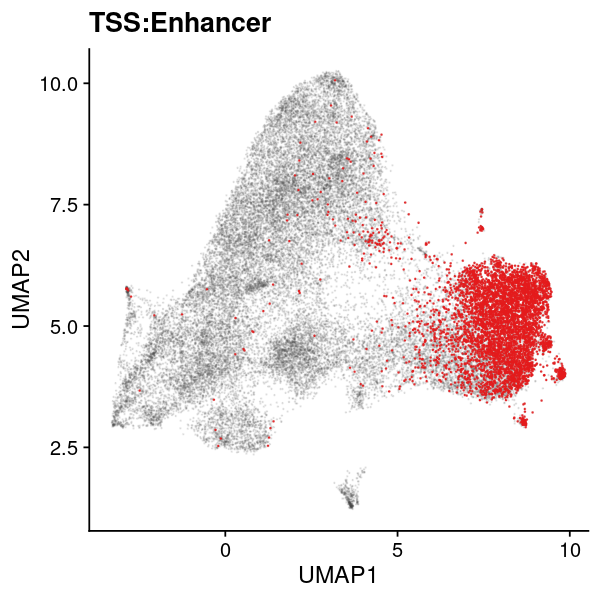

In [10]:
lst = lst_vec_txt_region_fcc
txt = "TSS:Enhancer"
vec = lst[[txt]]

dat = dat_umap_chipseq_full
tmp = dat %>% dplyr::filter(Region %in% vec)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2), color="grey30", size = 0.1, alpha = 0.1) + 
    geom_point(data = tmp, aes(x=UMAP1, y=UMAP2), color="#e41a1c",    size = 0.1, alpha = 0.7) +
    theme_cowplot() +
    labs(title = txt) 
options(repr.plot.height = 5, repr.plot.width = 5)
print(gpt)

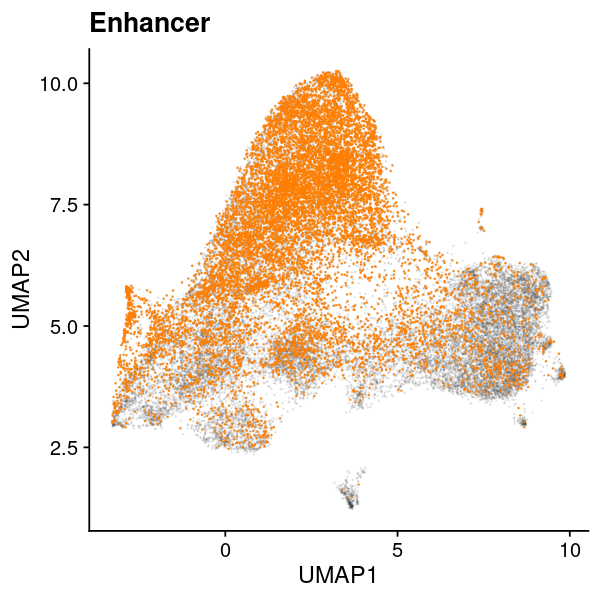

In [11]:
lst = lst_vec_txt_region_fcc
txt = "Enhancer"
vec = lst[[txt]]

dat = dat_umap_chipseq_full
tmp = dat %>% dplyr::filter(Region %in% vec)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2), color="grey30", size = 0.1, alpha = 0.1) + 
    geom_point(data = tmp, aes(x=UMAP1, y=UMAP2), color="#ff7f00",    size = 0.1, alpha = 0.7) +
    theme_cowplot() +
    labs(title = txt) 
options(repr.plot.height = 5, repr.plot.width = 5)
print(gpt)

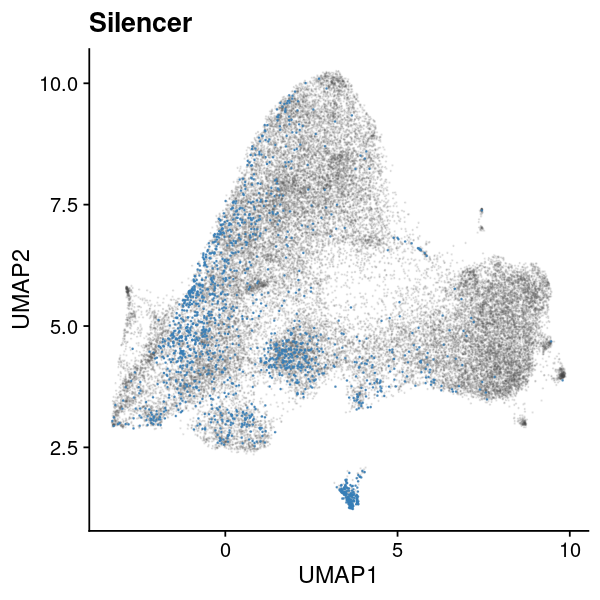

In [12]:
lst = lst_vec_txt_region_fcc
txt = "Silencer"
vec = lst[[txt]]

dat = dat_umap_chipseq_full
tmp = dat %>% dplyr::filter(Region %in% vec)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2), color="grey30", size = 0.1, alpha = 0.1) + 
    geom_point(data = tmp, aes(x=UMAP1, y=UMAP2), color="#377eb8",    size = 0.1, alpha = 0.7) +
    theme_cowplot() +
    labs(title = txt) 
options(repr.plot.height = 5, repr.plot.width = 5)
print(gpt)

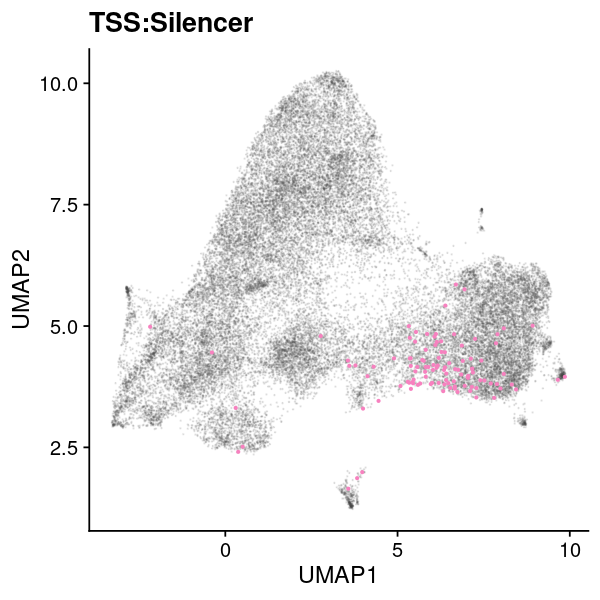

In [13]:
lst = lst_vec_txt_region_fcc
txt = "TSS:Silencer"
vec = lst[[txt]]

dat = dat_umap_chipseq_full
tmp = dat %>% dplyr::filter(Region %in% vec)

gpt = ggplot() + 
    geom_point(data = dat, aes(x=UMAP1, y=UMAP2), color="grey30", size = 0.1, alpha = 0.1) + 
    geom_point(data = tmp, aes(x=UMAP1, y=UMAP2), color="#f781bf",size = 0.5) +
    theme_cowplot() +
    labs(title = txt) 
options(repr.plot.height = 5, repr.plot.width = 5)
print(gpt)

In [ ]:
dat = dat %>% dplyr::left_join(mat_region_annot_merge, by = "Region")